# Identify spatial domains in the mouse spleen (bin100) using DIRAC

- by CHANG XU changxu@nus.edu.sg.
- Last update: October 4th 2024

## Download the data （Under review, will be provided later）
- if you are have ``wget`` installed, you can run the following code to automatically download and unzip the data.

In [ ]:
# Skip this cells if data are already download
! wget -O C03833D6_bin100_Protein.h5ad "*******"
! wget -O C03833D6_bin100_RNA.h5ad "*******"

- if you do not have wget installed, manually download data from the links below:
    - Mouse spleen bin100 collected from ADT: 
    - Mouse spleen bin100 from Protein: 

## DIRAC's vertical integration of RNA + Protein data from the mouse spleen

In [1]:
########## load packages
import os 
import sys
import random
sys.path.append("/home/project/11003054/changxu/Projects/SpaGNNs/Final_code/spagnns")

import pandas as pd 
import numpy as np 
import torch
import scanpy as sc
import anndata
import matplotlib.pyplot as plt
import time
import spateo as st

######## load dirac
from main import integrate_app
from utils import get_single_edge_index, get_multi_edge_index, lsi, _optimize_cluster, _priori_cluster, mclust_R
from torch_geometric.nn import knn_graph, radius_graph
import episcanpy as epi
from torch_geometric.utils import to_dense_adj
from adj import graph

2024-10-18 12:39:36.297555: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-10-18 12:39:36.300551: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-10-18 12:39:36.308525: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-18 12:39:36.321096: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-18 12:39:36.324314: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-10-18 12:39:36.333933: I tensorflow/core/platform/cpu_feature_gu

[easydl] tensorflow not available!


In [2]:
def seed_torch(seed=1029):   
    random.seed(seed)    
    os.environ['PYTHONHASHSEED'] = str(seed)    
    np.random.seed(seed)    
    torch.manual_seed(seed)    
    torch.cuda.manual_seed(seed)    
    torch.cuda.manual_seed_all(seed) 
    # if you are using multi-GPU.    
    torch.backends.cudnn.benchmark = False    
    torch.backends.cudnn.deterministic = True

seed_torch(seed=6)

In [3]:
data_path = "/home/project/11003054/changxu/Data/Stereo_cite_seq/C03833D6/Data"
data_name = "C03833D6_bin100"
methods = "Dirac"
now = time.strftime("%Y%m%d%H%M%S", time.localtime(time.time()))

In [4]:
adata_RNA = sc.read(os.path.join(data_path, f"{data_name}_RNA.h5ad"))
adata_Protein = sc.read(os.path.join(data_path, f"{data_name}_Protein.h5ad"))

adata_RNA.raw = adata_RNA.copy()
adata_Protein.raw = adata_Protein.copy()

In [5]:
adata_RNA

AnnData object with n_obs × n_vars = 9896 × 27211
    obs: 'orig.ident', 'x', 'y'
    uns: 'bin_size', 'bin_type', 'resolution', 'sn'
    obsm: 'spatial'

In [6]:
adata_Protein

AnnData object with n_obs × n_vars = 9897 × 128
    obs: 'orig.ident', 'x', 'y'
    uns: 'bin_size', 'bin_type', 'resolution', 'sn'
    obsm: 'spatial'

In [7]:
common_index = adata_RNA.obs_names.intersection(adata_Protein.obs_names)
adata_RNA = adata_RNA[common_index]
adata_Protein = adata_Protein[common_index]

In [8]:
adata_RNA

View of AnnData object with n_obs × n_vars = 9895 × 27211
    obs: 'orig.ident', 'x', 'y'
    uns: 'bin_size', 'bin_type', 'resolution', 'sn'
    obsm: 'spatial'

In [9]:
adata_Protein

View of AnnData object with n_obs × n_vars = 9895 × 128
    obs: 'orig.ident', 'x', 'y'
    uns: 'bin_size', 'bin_type', 'resolution', 'sn'
    obsm: 'spatial'

In [10]:
######### Data processing
adata_RNA.obs["Omics"] = data_name + "_mRNA"
adata_RNA.obs['Omics'] = adata_RNA.obs['Omics'].astype('category')
adata_Protein.obs["Omics"] = data_name + "_Protein"
adata_Protein.obs['Omics'] = adata_Protein.obs['Omics'].astype('category')

In [11]:
######### Data processing
sc.pp.filter_genes(adata_RNA, min_cells=3)
sc.pp.normalize_total(adata_RNA, target_sum=1e4)
sc.pp.log1p(adata_RNA)
sc.pp.scale(adata_RNA)
sc.tl.pca(adata_RNA, n_comps=200)

In [12]:
######### Data processing
sc.pp.normalize_total(adata_Protein, target_sum=1e4)
sc.pp.log1p(adata_Protein)
sc.pp.scale(adata_Protein)

In [13]:
adata_RNA.obsm['spatial'] = adata_RNA.obsm['spatial'].astype('float32')

In [14]:
edge_index = get_single_edge_index(adata_RNA.obsm["spatial"].copy(), n_neighbors = 8, graph_methods = "knn")
print(len(edge_index)/adata_RNA.shape[0])
edge_index = torch.LongTensor(edge_index).T

8.0


In [15]:
y = pd.Categorical(
            np.array(adata_RNA.obs["Omics"]),
            categories=np.unique(adata_RNA.obs["Omics"]),
        ).codes
save_path = os.path.join("/home/users/nus/changxu/scratch/section5/Results", f"{data_name}_{methods}", f"{now}")
if not os.path.exists(save_path):
	os.makedirs(save_path)

In [16]:
###### Training Dirac for spatial multi-omics
unsuper = integrate_app(save_path = save_path, use_gpu = True, subgraph=True)
samples = unsuper._get_data(dataset_list = [adata_RNA.obsm["X_pca"].copy(), adata_Protein.X.copy()],
							batch_list = [y, y],
							domain_list = [np.zeros(adata_RNA.shape[0]), np.ones(adata_Protein.shape[0])],
                            edge_index = edge_index,
							num_parts = 10,
							num_workers = 1,
							batch_size = 1,)
models = unsuper._get_model(samples, 
						n_hiddens = 128,
        				n_outputs = 64,
        				opt_GNN = "GCN",) 
data_z, combine_recon, _ = unsuper._train_dirac_integrate(samples = samples,
							models = models,
							epochs = 100,
                            lamb = 5e-4, 
                    		scale_loss = 0.5,
                            lr = 1e-3,
                            wd = 5e-2,
    						)

Found 2 unique domains.


Computing METIS partitioning...
Done!
Project..: 100%|█| 100/100 [00:38<00:00,  2.57it/s, Loss=1.31e+3


In [17]:
adata_RNA.obsm[f"{methods}_embed"] = data_z[: adata_RNA.shape[0], :]
adata_Protein.obsm[f"{methods}_embed"] = data_z[adata_RNA.shape[0] :, :]
adata_RNA.obsm["combine_recon"] = combine_recon
adata_Protein.obsm["combine_recon"] = combine_recon

R[write to console]:                    __           __ 
   ____ ___  _____/ /_  _______/ /_
  / __ `__ \/ ___/ / / / / ___/ __/
 / / / / / / /__/ / /_/ (__  ) /_  
/_/ /_/ /_/\___/_/\__,_/____/\__/   version 6.0.1
Type 'citation("mclust")' for citing this R package in publications.



fitting ...
  |======================================================================| 100%


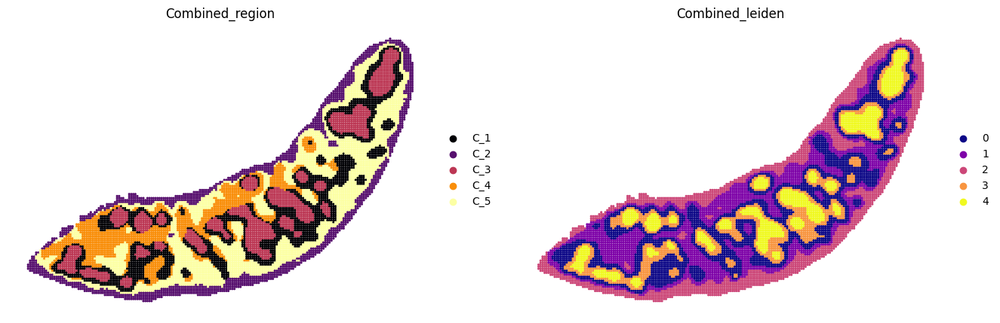

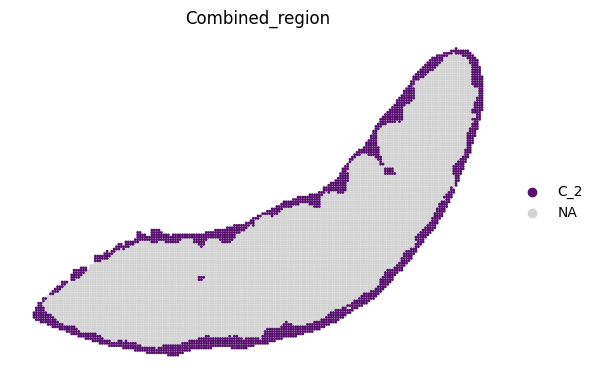

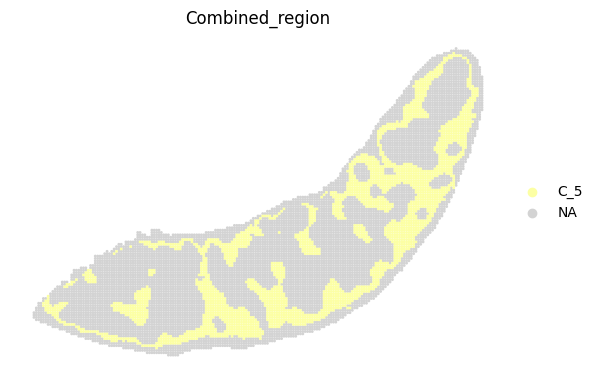

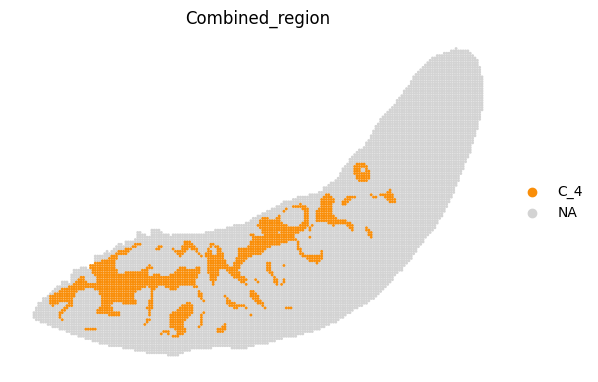

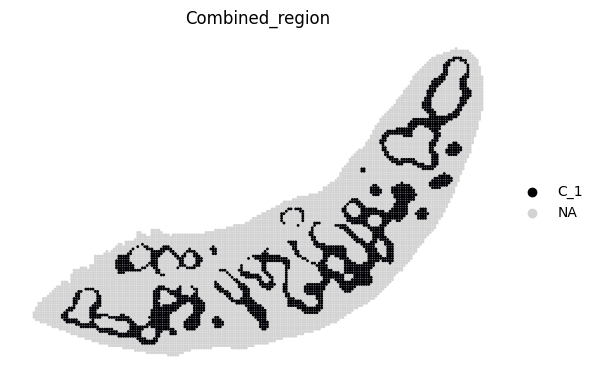

...

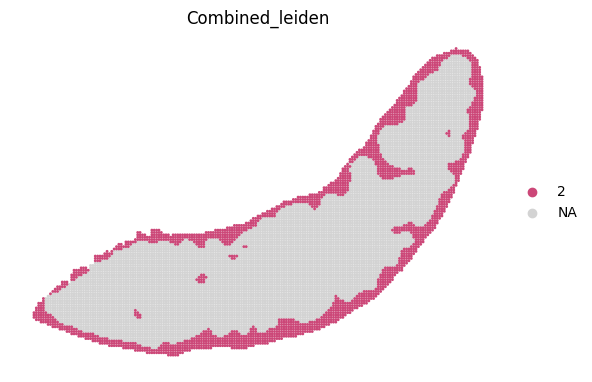

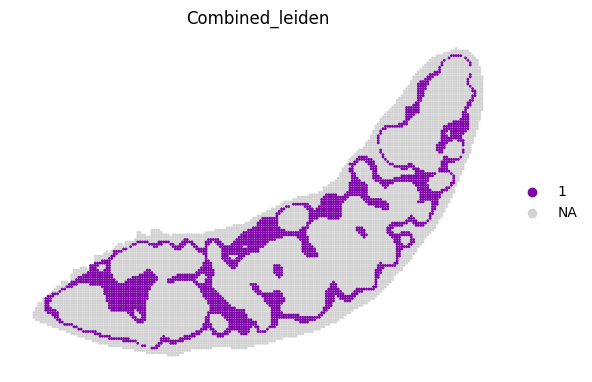

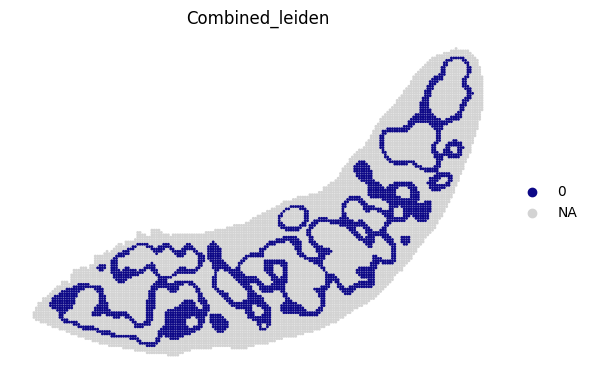

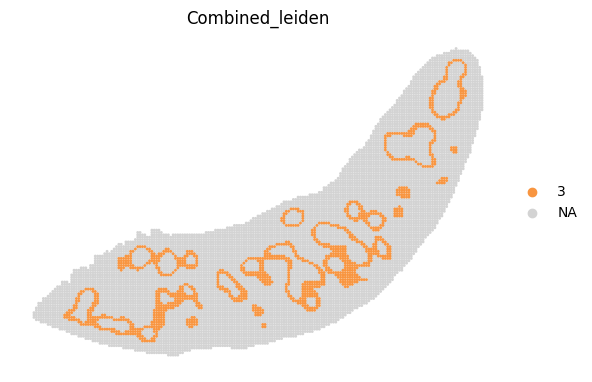

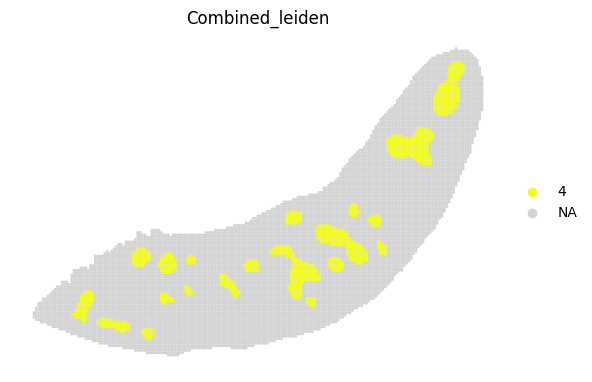

In [18]:
####### Combined
n_clusters = 5
sc.pp.neighbors(adata_RNA, use_rep='combine_recon')
res_RNA_ATAC = _priori_cluster(adata_RNA, eval_cluster_n=n_clusters)
sc.tl.leiden(adata_RNA, resolution=0.09, key_added="Combined_leiden")
mclust_R(adata=adata_RNA, num_cluster=n_clusters, used_obsm="combine_recon", key_added="Combined_mclust")

adata_RNA.obs["Combined_region"] = "C_" + adata_RNA.obs["Combined_mclust"].astype(str)
adata_RNA.obs["Combined_region"] = adata_RNA.obs["Combined_region"].astype('category')
adata_RNA.uns["__type"] = 'UMI'

# Create color dictionary for Combined regions
colors_list = plt.cm.get_cmap("inferno", len(adata_RNA.obs["Combined_region"].unique())).colors
color_dict = dict(zip(adata_RNA.obs["Combined_region"].cat.categories, colors_list))

# Set the number of subplots and layout
n_panels = 2
fig, axs = plt.subplots(1, n_panels, figsize=(8 * n_panels, 6))

# Color schemes and colormap list
colors = ["Combined_region", "Combined_leiden"]
colormaps = [color_dict, "plasma"]  # Example colormaps, can be modified as needed

# Plot each panel
for ax, color, cmap in zip(axs, colors, colormaps):
    sc.pl.spatial(adata_RNA, color=color, palette=cmap, frameon=False, spot_size=120, ax=ax, show=False)
    ax.set_title(color)

adata_RNA.uns["Combined_region_colors"] = color_dict

# Save the figure to the specified path, with filename containing date timestamp, high resolution, and tight bounding box
file_name = f"{data_name}_{methods}_Combined_spatial_{now}.pdf"
file_path = os.path.join(save_path, file_name)
fig.savefig(file_path, bbox_inches='tight', dpi=300)

# Plot spatial visualization for each unique Combined region
for i in adata_RNA.obs["Combined_region"].unique():
    sc.pl.spatial(adata_RNA, color='Combined_region', groups=[i], palette=color_dict, frameon=False, spot_size=120)

# Plot spatial visualization for each unique Combined Leiden cluster
for i in adata_RNA.obs["Combined_leiden"].unique():
    sc.pl.spatial(adata_RNA, color='Combined_leiden', groups=[i], palette="plasma", frameon=False, spot_size=120)


fitting ...
  |======================================================================| 100%


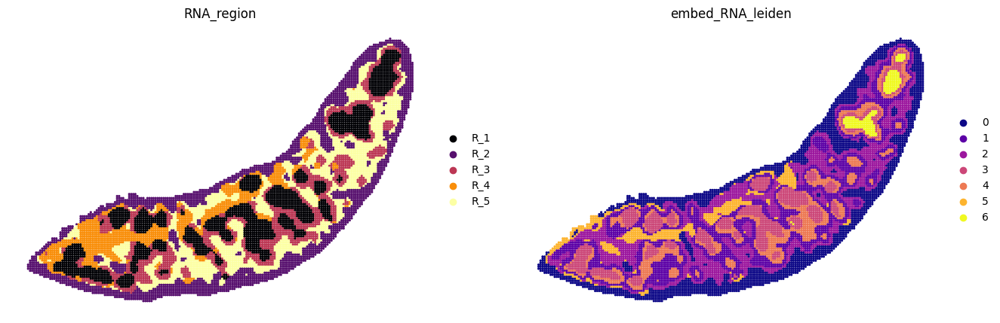

In [19]:
####### RNA
sc.pp.neighbors(adata_RNA, use_rep=f"{methods}_embed", n_neighbors=20)
# res_RNA_ATAC = _priori_cluster(adata_RNA, eval_cluster_n = n_clusters)
sc.tl.leiden(adata_RNA, resolution=0.2, key_added="embed_RNA_leiden")
mclust_R(adata=adata_RNA, num_cluster=n_clusters, used_obsm=f"{methods}_embed", key_added="embed_RNA_mclust")

adata_RNA.obs["RNA_region"] = "R_" + adata_RNA.obs["embed_RNA_mclust"].astype(str)
adata_RNA.obs["RNA_region"] = adata_RNA.obs["RNA_region"].astype('category')

# Generate color dictionary for RNA regions
colors_list = plt.cm.get_cmap("inferno", len(adata_RNA.obs["RNA_region"].unique())).colors
color_dict = dict(zip(adata_RNA.obs["RNA_region"].cat.categories, colors_list))

# Set the number of subplots and layout
n_panels = 2
fig, axs = plt.subplots(1, n_panels, figsize=(8 * n_panels, 6))

# Color schemes and colormap list
colors = ["RNA_region", "embed_RNA_leiden"]
colormaps = [color_dict, "plasma"]  # Example colormaps, can be modified as needed

# Plot each panel
for ax, color, cmap in zip(axs, colors, colormaps):
    sc.pl.spatial(adata_RNA, color=color, palette=cmap, frameon=False, spot_size=120, ax=ax, show=False)
    ax.set_title(color)

adata_RNA.uns["RNA_region_colors"] = color_dict

# Save the figure to the specified path, with filename containing date timestamp, high resolution, and tight bounding box
file_name = f"{data_name}_{methods}_RNA_spatial_{now}.pdf"
file_path = os.path.join(save_path, file_name)
fig.savefig(file_path, bbox_inches='tight', dpi=300)


fitting ...
  |======================================================================| 100%


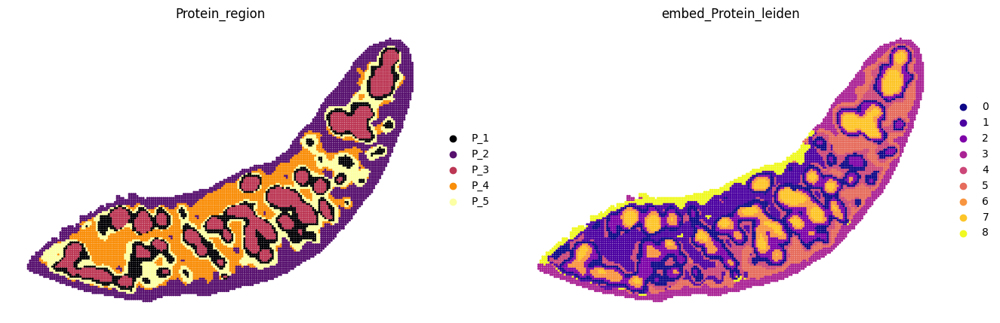

In [20]:
###### Protein
sc.pp.neighbors(adata_Protein, use_rep=f"{methods}_embed", n_neighbors=20)
# res_RNA_ATAC = _priori_cluster(adata_Protein, eval_cluster_n = n_clusters)
sc.tl.leiden(adata_Protein, resolution=0.3, key_added="embed_Protein_leiden")
mclust_R(adata=adata_Protein, num_cluster=n_clusters, used_obsm=f"{methods}_embed", key_added="embed_Protein_mclust")

adata_Protein.obs["Protein_region"] = "P_" + adata_Protein.obs["embed_Protein_mclust"].astype(str)
adata_Protein.obs["Protein_region"] = adata_Protein.obs["Protein_region"].astype('category')

# Generate color dictionary for Protein regions
colors_list = plt.cm.get_cmap("inferno", len(adata_Protein.obs["Protein_region"].unique())).colors
color_dict = dict(zip(adata_Protein.obs["Protein_region"].cat.categories, colors_list))

# Set the number of subplots and layout
n_panels = 2
fig, axs = plt.subplots(1, n_panels, figsize=(8 * n_panels, 6))

# Color schemes and colormap list
colors = ["Protein_region", "embed_Protein_leiden"]
colormaps = [color_dict, "plasma"]  # Example colormaps, can be modified as needed

# Plot each panel
for ax, color, cmap in zip(axs, colors, colormaps):
    sc.pl.spatial(adata_Protein, color=color, palette=cmap, frameon=False, spot_size=120, ax=ax, show=False)
    ax.set_title(color)

adata_Protein.uns["Protein_region_colors"] = color_dict

# Save the figure to the specified path, with filename containing date timestamp, high resolution, and tight b


fitting ...
  |======================================================================| 100%


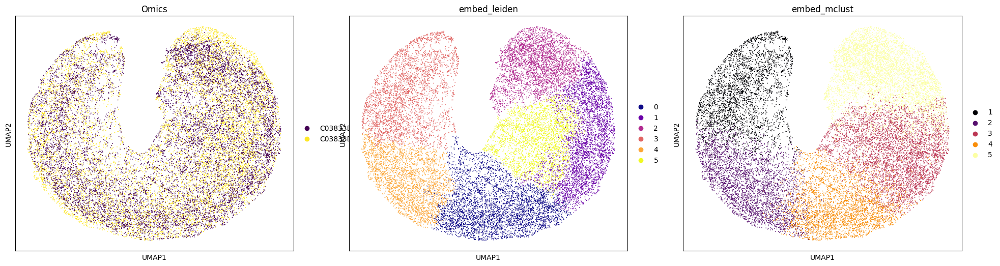

In [21]:
adata = anndata.AnnData(data_z)
adata.obs = pd.concat([adata_RNA.obs, adata_Protein.obs])
adata.obsm[f"{methods}_embed"] = data_z
sc.pp.neighbors(adata, use_rep='X')
sc.tl.umap(adata)
# res_RNA_ATAC = _priori_cluster(adata, eval_cluster_n = n_clusters)
sc.tl.leiden(adata, resolution=0.13, key_added="embed_leiden")
mclust_R(adata=adata, num_cluster=n_clusters, used_obsm=f"{methods}_embed", key_added="embed_mclust")

# Set the number of subplots and layout
n_panels = 3
fig, axs = plt.subplots(1, n_panels, figsize=(8 * n_panels, 6))

# Color schemes and colormap list
colors = ['Omics', "embed_leiden", "embed_mclust"]
colormaps = ["viridis", "plasma", "inferno"]  # Example colormaps, can be modified as needed

# Plot each panel
for ax, color, cmap in zip(axs, colors, colormaps):
    sc.pl.umap(adata, color=color, palette=cmap, ax=ax, show=False)
    ax.set_title(color)

# Save the figure to the specified path, with filename containing date timestamp, high resolution, and tight bounding box
file_name = f"{data_name}_{methods}_embed_umap_{now}.pdf"
file_path = os.path.join(save_path, file_name)
fig.savefig(file_path, bbox_inches='tight', dpi=300)

# # Close the figure to free memory
# plt.close(fig)

In [22]:
adata_RNA.obs["embed_leiden"] = adata.obs["embed_leiden"][adata.obs["Omics"] == data_name + "_mRNA"]
adata_Protein.obs["embed_leiden"] = adata.obs["embed_leiden"][adata.obs["Omics"] == data_name + "_Protein"]
adata_RNA.obs["embed_mclust"] = adata.obs["embed_mclust"][adata.obs["Omics"] == data_name + "_mRNA"]
adata_Protein.obs["embed_mclust"] = adata.obs["embed_mclust"][adata.obs["Omics"] == data_name + "_Protein"]

In [23]:
####### Save Data
adata.write(os.path.join(save_path,f"{data_name}_{methods}_RNA_Protein_{now}.h5ad"),compression="gzip")
adata_RNA.write(os.path.join(save_path,f"{data_name}_{methods}_RNA_{now}.h5ad"),compression="gzip")
adata_Protein.write(os.path.join(save_path,f"{data_name}_{methods}_Protein_{now}.h5ad"),compression="gzip")

In [24]:
save_path

'/home/users/nus/changxu/scratch/section5/Results/C03833D6_bin100_Dirac/20240925163954'

In [25]:
print(adata_RNA.uns["Combined_region_colors"])

['#000004ff', '#57106eff', '#bc3754ff', '#f98e09ff', '#fcffa4ff']


## Spatial domain names and differential gene and protein expression

In [53]:
import os 
import sys
import random
import pandas as pd 
import numpy as np 
import torch
import scanpy as sc
import anndata
import matplotlib.pyplot as plt
import time
import spateo as st

data_path = "/home/project/11003054/changxu/Data/Stereo_cite_seq/C03833D6/Data"
data_name = "C03833D6_bin100"
methods = "Dirac"
save_path = '/home/users/nus/changxu/scratch/section5/Results/C03833D6_bin100_Dirac/20240925142432'

adata_RNA = sc.read(os.path.join(save_path,f"{data_name}_{methods}_RNA_20240925142432.h5ad"))
adata_Protein = sc.read(os.path.join(save_path,f"{data_name}_{methods}_Protein_20240925142432.h5ad"))

adata_RNA = adata_RNA.raw.to_adata()
adata_Protein = adata_Protein.raw.to_adata()

[<Axes: title={'center': 'region domain'}, xlabel='spatial1', ylabel='spatial2'>]

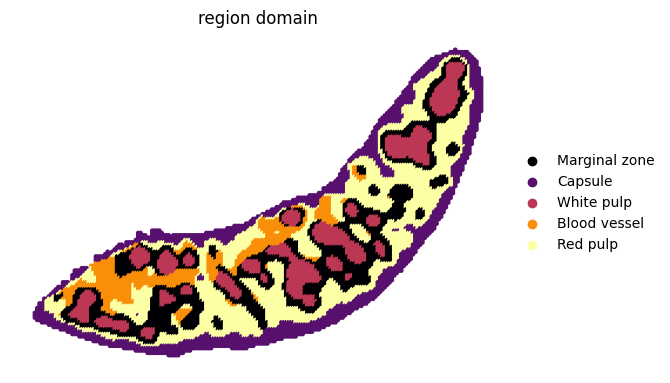

In [54]:
# create a dictionary to map cluster to annotation label
cluster2annotation = {
    "C_1": "Marginal zone",
    "C_2": "Capsule",
    "C_3": "White pulp",
    "C_4": "Blood vessel",
    "C_5": "Red pulp",
}

# add a new `.obs` column called `cell type` by mapping clusters to annotation using pandas `map` function
adata_RNA.obs["region domain"] = adata_RNA.obs['Combined_region'].map(cluster2annotation).astype("category")

########### save colors
cluster2colors = {
    "Marginal zone": '#000004ff',
    "Capsule": '#57106eff',
    "White pulp": '#bc3754ff',
    "Blood vessel":'#f98e09ff',
    "Red pulp":'#fcffa4ff',
}
sc.pl.spatial(adata_RNA, color=["region domain"], palette=cluster2colors, frameon=False, spot_size=200, show=False)

In [55]:
adata_RNA.uns["region domain_colors"]

['#000004ff', '#57106eff', '#bc3754ff', '#f98e09ff', '#fcffa4ff']

In [56]:
genes_to_remove = [gene for gene in adata_RNA.var_names if gene.startswith("Gm") or gene.startswith("Mt")]
# Remove these genes
adata_RNA = adata_RNA[:, ~adata_RNA.var_names.isin(genes_to_remove)]
genes_filter_out = pd.read_csv("/home/project/11003054/changxu/Data/Stereo_cite_seq/genes-filter-out.csv")
genes_filter_list = genes_filter_out['genes'].tolist()
adata_RNA = adata_RNA[:, ~adata_RNA.var_names.isin(genes_filter_list)]

# Print the number of genes to be removed for verification
print(f"Removing {len(genes_to_remove) + len(genes_filter_list)} genes that start with 'Gm', 'Mt', or 'Rpl'")

Removing 5877 genes that start with 'Gm' or 'Mt' or 'Rpl'


In [57]:
sc.pp.normalize_total(adata_RNA, target_sum=1e4)
sc.pp.log1p(adata_RNA)
adata_RNA.raw = adata_RNA.copy()
# sc.pp.highly_variable_genes(adata_RNA, flavor="seurat_v3_paper", n_top_genes=2000, subset=True)
sc.tl.rank_genes_groups(adata_RNA, groupby="region domain", method="wilcoxon") #, use_raw=False

/home/users/nus/changxu/Software/anaconda3/envs/SpaGNNs_gpu/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning:

Received a view of an AnnData. Making a copy.



In [58]:
result = adata_RNA.uns["rank_genes_groups"]
groups = result["names"].dtype.names
pd.DataFrame(
    {group + '_' + key: result[key][group]
    for group in groups for key in ['names', 'pvals','pvals_adj','logfoldchanges']}).to_csv(os.path.join(save_path, f'{data_name}_{methods}_markerGenes.csv'))

In [59]:
adata_RNA.uns["region domain_colors"]

array(['#000004ff', '#57106eff', '#bc3754ff', '#f98e09ff', '#fcffa4ff'],
      dtype='<U9')

In [60]:
save_path

'/home/users/nus/changxu/scratch/section5/Results/C03833D6_bin100_Dirac/20240925142432'

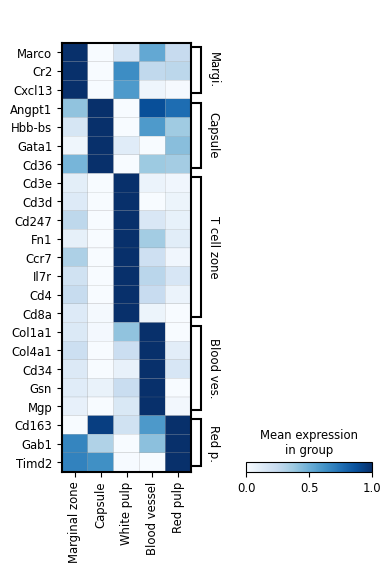

In [61]:
marker_genes = {'Marginal zone': ['Marco', 'Cr2', 'Cxcl13'], 
 'Capsule': ['Angpt1', 'Hbb-bs', 'Gata1', 'Cd36'], 
 'T cell zone': ['Cd3e','Cd3d', 'Cd247', 'Fn1', 'Ccr7', 'Il7r','Cd4', 'Cd8a'],
 'Blood vessel': ['Col1a1', 'Col4a1','Cd34', 'Gsn', 'Mgp'],  #'Col3a1', 
 'Red pulp': ['Cd163','Gab1', 'Timd2'], 
}

fig, ax = plt.subplots(figsize=(4, 6))
sc.pl.matrixplot(
    adata_RNA,
    marker_genes, # as a dictionary, will be sorted
    groupby="region domain",
    dendrogram=False,
    use_raw=False,
    standard_scale = "var",
    cmap = "Blues",
    var_group_rotation = 0,
    swap_axes = True,
    # save = os.path.join(save_path,"bin100_region_marker_genes.pdf"),
    ax=ax,
)

fig.savefig(os.path.join(save_path,"bin100_region_marker_genes.pdf"), dpi = 300)



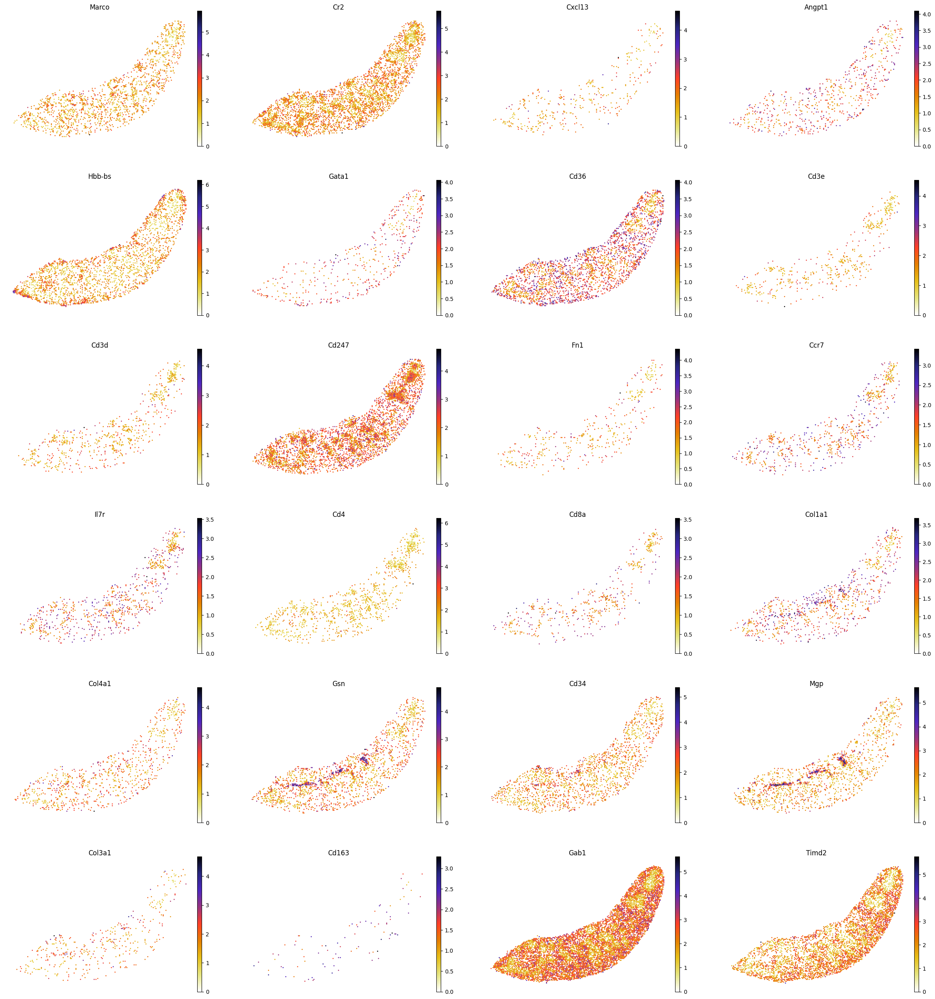

In [62]:
########### 画一些基因和蛋白的映射图
gene_list=['Marco', 'Cr2', 'Cxcl13','Angpt1', 'Hbb-bs', 'Gata1', 'Cd36','Cd3e','Cd3d', 'Cd247', \
           'Fn1', 'Ccr7', 'Il7r','Cd4', 'Cd8a','Col1a1', 'Col4a1', 'Gsn', 'Cd34', 'Mgp', 'Col3a1', \
          'Cd163','Gab1', 'Timd2']
filtered_gene_list = [gene for gene in gene_list if gene in adata_RNA.var_names]

sc.pl.spatial(adata_RNA, color=filtered_gene_list, frameon=False, spot_size=120, cmap = 'CMRmap_r', show=False)
plt.savefig(os.path.join(save_path,f"{data_name}_genes.pdf"), bbox_inches='tight', dpi=300)

# protein_list = ["CD31_Ms","CD73_Ms"]
# filtered_protein_list = [protein for protein in protein_list if protein in adata_Protein.var_names]
# sc.pl.spatial(adata_Protein, color=filtered_protein_list, frameon=False, spot_size=120, cmap = 'RdYlBu_r')
# plt.savefig(os.path.join(save_path,f"{data_name}_proteins.pdf"), bbox_inches='tight', dpi=300)

In [70]:
adata_Protein.var_names.tolist()

['CD102_Ms',
 'CD103_Ms',
 'CD106_Ms',
 'CD107a_Ms',
 'CD115_Ms',
 'CD11a_Ms',
 'CD11b_MsHu',
 'CD11c_Ms',
 'CD120b_Ms',
 'CD127_Ms',
 'CD134_Ms',
 'CD137_Ms',
 'CD138_Ms',
 'CD150_Ms',
 'CD155_Ms',
 'CD159a_Ms',
 'CD160_Ms',
 'CD163_Ms',
 'CD169_Ms',
 'CD170_Ms',
 'CD172a_Ms',
 'CD185_Ms',
 'CD186_Ms',
 'CD199_Ms',
 'CD19_Ms',
 'CD1d_Ms',
 'CD200R3_Ms',
 'CD200R_Ms',
 'CD200_Ms',
 'CD205_Ms',
 'CD20_Ms',
 'CD21_35_Ms',
 'CD223_Ms',
 'CD226_Ms_10E5',
 'CD22_Ms',
 'CD23_Ms',
 'CD24_Ms',
 'CD25_Ms',
 'CD26_Ms',
 'CD270_Ms',
 'CD272_Ms',
 'CD274_Ms',
 'CD279_Ms',
 'CD27_MsHu',
 'CD29_Ms',
 'CD2_Ms',
 'CD301a_Ms',
 'CD301b_Ms',
 'CD304_Ms',
 'CD317_Ms',
 'CD31_Ms',
 'CD357_Ms',
 'CD366_Ms',
 'CD36_Ms',
 'CD371_Ms',
 'CD38_Ms',
 'CD3_Ms',
 'CD40_Ms',
 'CD41_Ms',
 'CD43_Ms',
 'CD44_MsHu',
 'CD45R_MsHu',
 'CD45_2_Ms',
 'CD45_Ms',
 'CD48_Ms',
 'CD49a_Ms',
 'CD49b_Ms',
 'CD49d_Ms',
 'CD49f_MsHu',
 'CD4_Ms',
 'CD51_Ms',
 'CD54_Ms',
 'CD55_Ms',
 'CD5_Ms',
 'CD61_Ms',
 'CD62L_Ms',
 'CD63_Ms',
 'CD

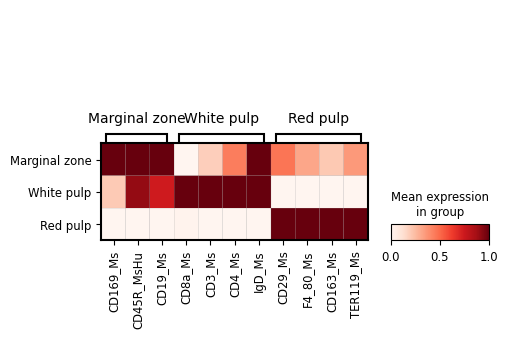

In [75]:
sc.pp.normalize_total(adata_Protein, target_sum=1e4)
sc.pp.log1p(adata_Protein)

marker_proteins = {'Marginal zone': ['CD169_Ms', 'CD45R_MsHu','CD19_Ms'], 
 'White pulp': ["CD8a_Ms", "CD3_Ms", "CD4_Ms", 'IgD_Ms'],
 'Red pulp': ['CD29_Ms','F4_80_Ms','CD163_Ms', 'TER119_Ms'], 
}

fig, ax = plt.subplots(figsize=(5, 3))
sc.pl.matrixplot(
    adata_Protein[adata_Protein.obs['region domain'].isin(['Marginal zone','White pulp','Red pulp'])],
    marker_proteins, # as a dictionary, will be sorted
    groupby="region domain",
    dendrogram=False,
    use_raw=False,
    standard_scale = "var",
    cmap = "Reds",
    var_group_rotation = 0,
    # swap_axes = True,
    # save = os.path.join(save_path,"bin100_region_marker_genes.pdf"),
    ax=ax,
)

fig.savefig(os.path.join(save_path,"bin100_region_marker_proteins.pdf"), dpi = 300)

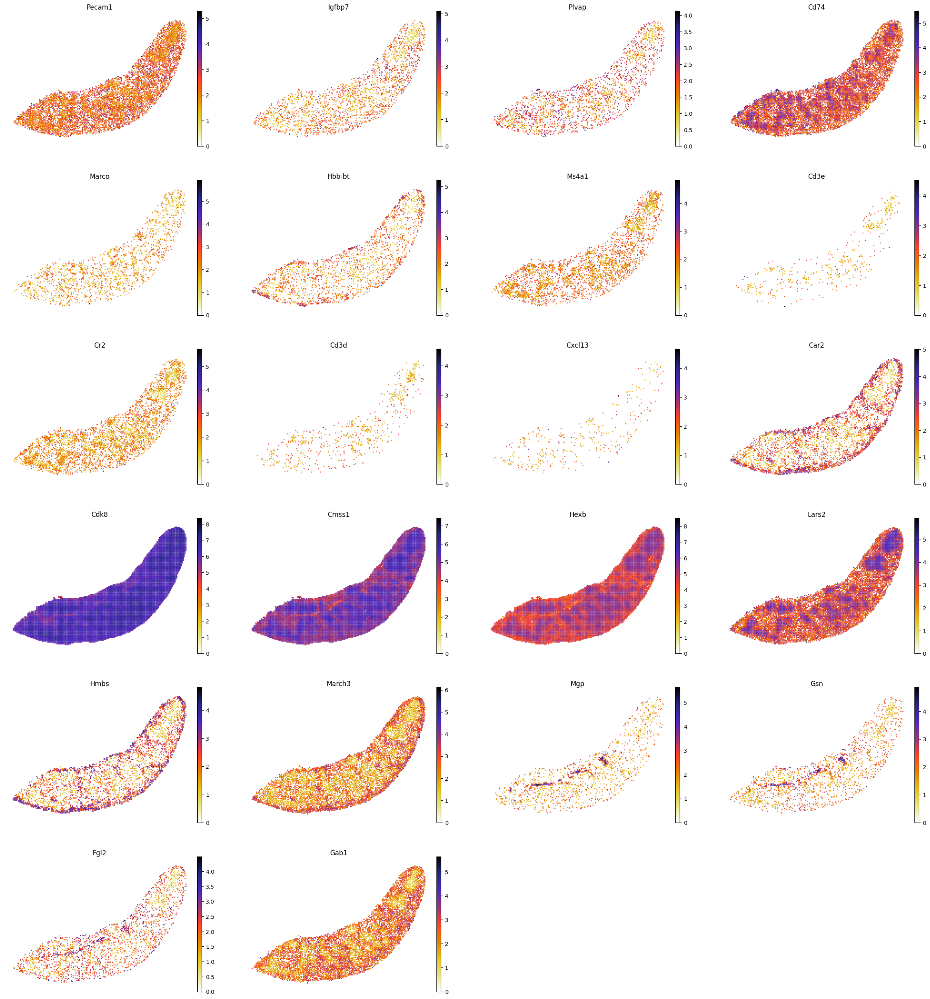

<Figure size 640x480 with 0 Axes>

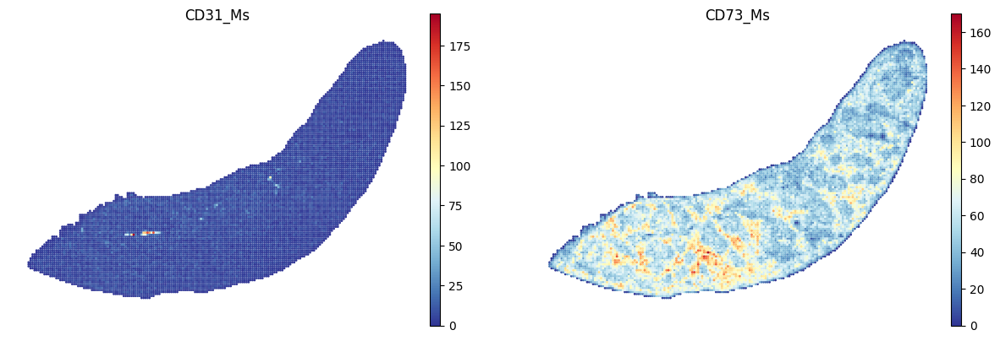

<Figure size 640x480 with 0 Axes>

In [10]:
########### 画一些基因和蛋白的映射图
gene_list=["Pecam1","Igfbp7","Plvap","Cd74","Marco","Hbb-bt", "Ms4a1", "Cd3e", "Cr2", "lghd", \
           "Cd3d", "Cxcl13", "Car2", "Cdk8", "Cmss1", "Hexb", "Lars2", "Hmbs", "March3", "Mgp", \
           "Gsn", "Fgl2", "Gab1"]
filtered_gene_list = [gene for gene in gene_list if gene in adata_RNA.var_names]

sc.pl.spatial(adata_RNA, color=filtered_gene_list, frameon=False, spot_size=120, cmap = 'CMRmap_r', show=False)
plt.savefig(os.path.join(save_path,f"{data_name}_genes.pdf"), bbox_inches='tight', dpi=300)

protein_list = ["CD31_Ms","CD73_Ms"]
filtered_protein_list = [protein for protein in protein_list if protein in adata_Protein.var_names]
sc.pl.spatial(adata_Protein, color=filtered_protein_list, frameon=False, spot_size=120, cmap = 'RdYlBu_r', show=False)
plt.savefig(os.path.join(save_path,f"{data_name}_proteins.pdf"), bbox_inches='tight', dpi=300)

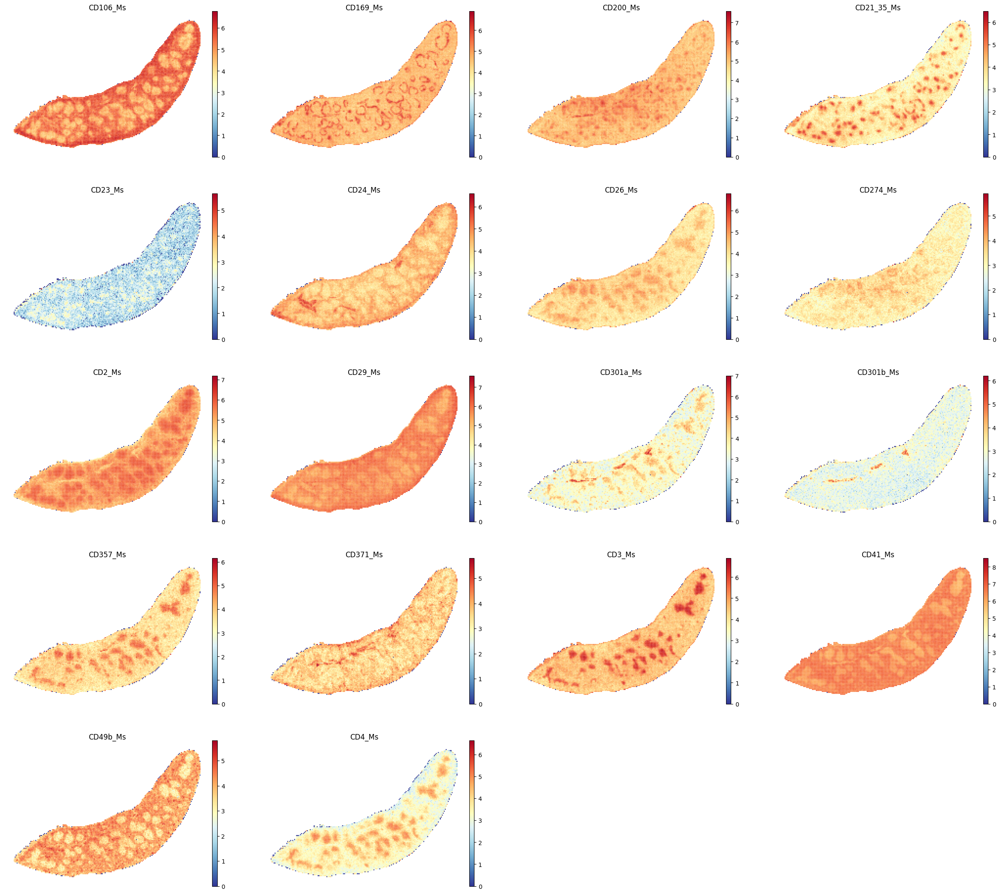

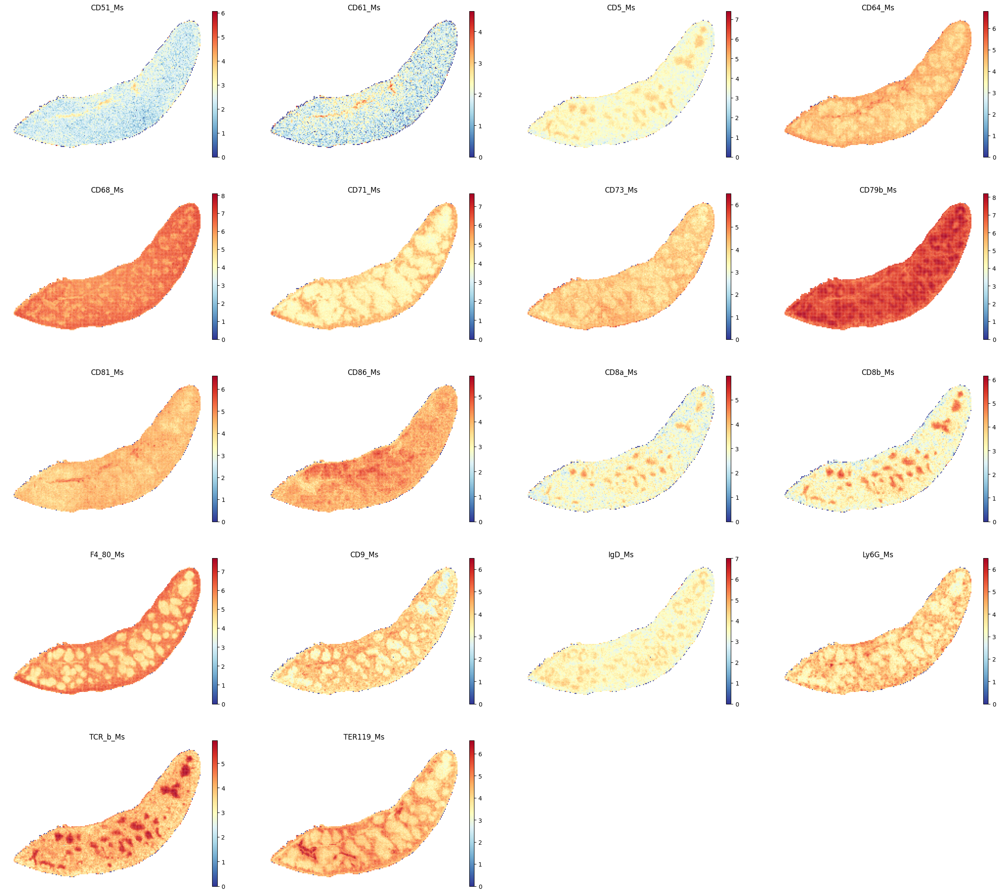

In [76]:
select_proteins_1 = ["CD106_Ms","CD169_Ms", "CD200_Ms","CD21_35_Ms", "CD23_Ms", "CD24_Ms", "CD26_Ms", \
                   "CD274_Ms", "CD2_Ms", "CD29_Ms", "CD301a_Ms", "CD301b_Ms", "CD357_Ms", "CD371_Ms", \
                   "CD3_Ms", "CD41_Ms", "CD49b_Ms", "CD4_Ms"]
sc.pl.spatial(adata_Protein, color=select_proteins_1, frameon=False, spot_size=120, cmap = 'RdYlBu_r', show=False)
plt.savefig(os.path.join(save_path,f"{data_name}_proteins_1.pdf"), bbox_inches='tight', dpi=300)


select_proteins_2 = ["CD51_Ms","CD61_Ms", "CD5_Ms","CD64_Ms", "CD68_Ms", "CD71_Ms", "CD73_Ms", \
                   "CD79b_Ms", "CD81_Ms", "CD86_Ms", "CD8a_Ms", "CD8b_Ms", "F4_80_Ms", "CD9_Ms", \
                   "IgD_Ms", "Ly6G_Ms", "TCR_b_Ms", "TER119_Ms"]
sc.pl.spatial(adata_Protein, color=select_proteins_2, frameon=False, spot_size=120, cmap = 'RdYlBu_r', show=False)
plt.savefig(os.path.join(save_path,f"{data_name}_proteins_2.pdf"), bbox_inches='tight', dpi=300)

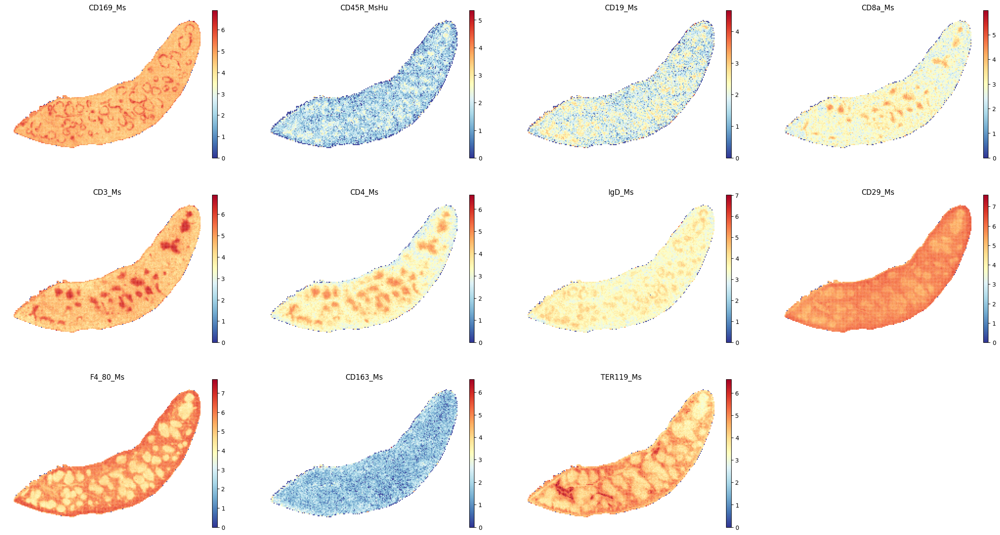

In [77]:
select_proteins_3 = ['CD169_Ms', 'CD45R_MsHu','CD19_Ms',\
                     "CD8a_Ms", "CD3_Ms", "CD4_Ms", 'IgD_Ms',\
                     'CD29_Ms','F4_80_Ms','CD163_Ms', 'TER119_Ms'
                    ]
sc.pl.spatial(adata_Protein, color=select_proteins_3, frameon=False, spot_size=120, cmap = 'RdYlBu_r', show=False)
plt.savefig(os.path.join(save_path,f"{data_name}_proteins_3.pdf"), bbox_inches='tight', dpi=300)

## Characterizing spatial domain profiles

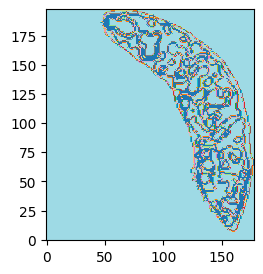

In [9]:
########### Plot some figures, cell type enrichment plot
from typing import Dict, Optional, Tuple, Union

import cv2
import numpy as np
from anndata import AnnData
import matplotlib.pyplot as plt
from numpngw import write_png
import pandas as pd 
import numpy as np 
import os
import sys
import scanpy as sc
import spateo as st

# Plot spatial domains with a bin size of 100 and save the image
st.pl.spatial_domains(adata_RNA, bin_size=100, label_key="Combined_region", save_img=os.path.join(save_path, "spatial_domains.png"))

In [10]:
adata_RNA.obsm['spatial_bin100'] = adata_RNA.obsm['spatial']//100

# Load spatial domain image as background
# adata_celltype = sc.read("")
adata_RNA = st.io.read_image(
    adata_RNA,
    filename=os.path.join(save_path, "spatial_domains.png"),
    img_layer="layer1",
    slice="slice1",
    scale_factor=1,
)

In [11]:
adata_RNA

AnnData object with n_obs × n_vars = 9895 × 21339
    obs: 'orig.ident', 'x', 'y', 'Omics', 'Combined_leiden', 'Combined_mclust', 'Combined_region', 'embed_RNA_leiden', 'embed_RNA_mclust', 'RNA_region', 'embed_leiden', 'embed_mclust'
    uns: 'Combined_leiden', 'Combined_leiden_colors', 'Combined_region_colors', 'RNA_region_colors', '__type', 'bin_size', 'bin_type', 'embed_RNA_leiden', 'embed_RNA_leiden_colors', 'log1p', 'neighbors', 'pca', 'resolution', 'sn', 'rank_genes_groups', 'dendrogram_Combined_region', 'spatial'
    obsm: 'Dirac_embed', 'X_pca', 'combine_recon', 'spatial', 'spatial_bin100'
    obsp: 'connectivities', 'distances'

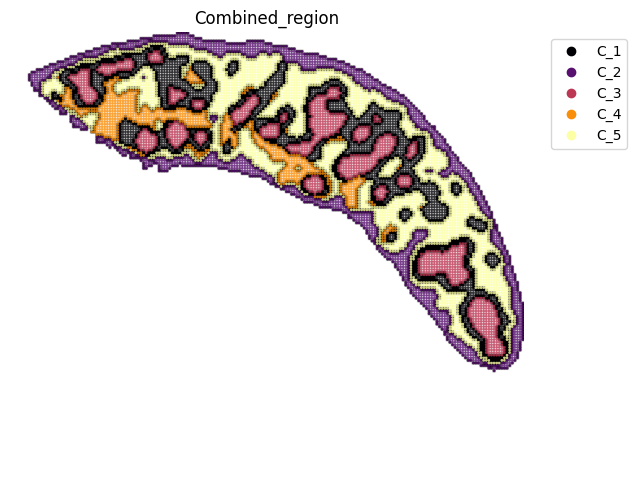

<Figure size 640x480 with 0 Axes>

In [12]:
fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    adata_RNA,
    space="spatial_bin100",
    color=["Combined_region"],
    alpha=0.8,
    figsize=(5, 3),
    show_legend="upper left",
    img_layers = "layer1",
    slices="slice1",
    dpi=300, 
    pointsize=0.1,
    color_key = adata_RNA.uns['Combined_region_colors'],
    ax=ax,
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_spatial_domains.pdf"))

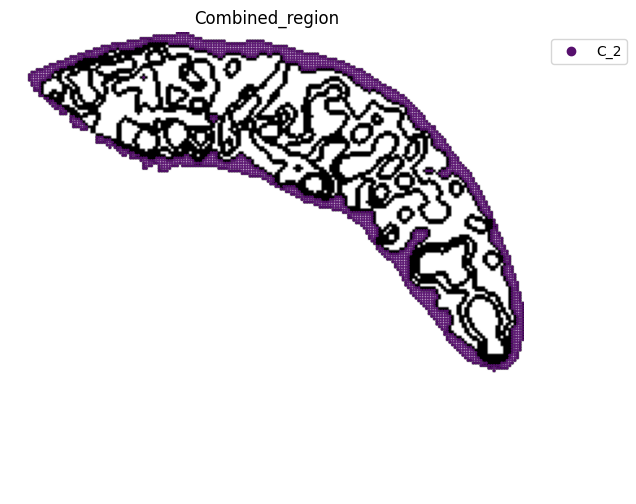

<Figure size 640x480 with 0 Axes>

In [13]:
fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    adata_RNA[adata_RNA.obs["Combined_region"].isin(["C_2"]), :],
    space="spatial_bin100",
    color=["Combined_region"],
    alpha=0.95,
    pointsize=0.05,
    figsize=(4, 3),
    show_legend="upper left",
    img_layers = "layer1",
    slices="slice1",
    color_key = adata_RNA.uns['Combined_region_colors'],
    ax = ax
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_spatial_domains_C2.png"))

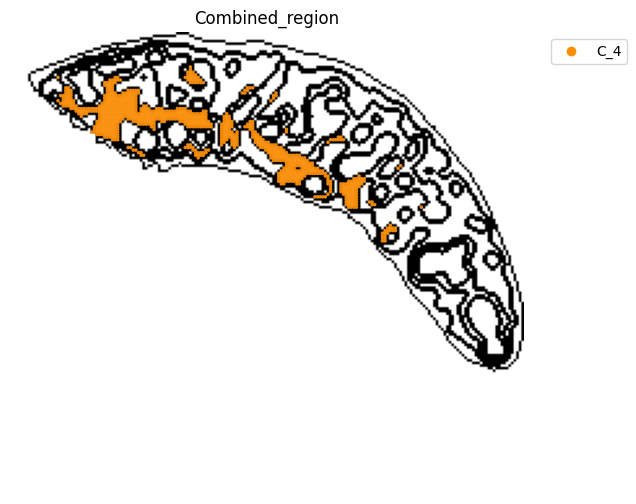

<Figure size 640x480 with 0 Axes>

In [14]:
fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    adata_RNA[adata_RNA.obs["Combined_region"].isin(["C_4"]), :],
    space="spatial_bin100",
    color=["Combined_region"],
    alpha=0.95,
    pointsize=0.05,
    figsize=(4, 3),
    show_legend="upper left",
    img_layers = "layer1",
    slices="slice1",
    color_key = adata_RNA.uns['Combined_region_colors'],
    ax = ax,
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_spatial_domains_C4.png"))

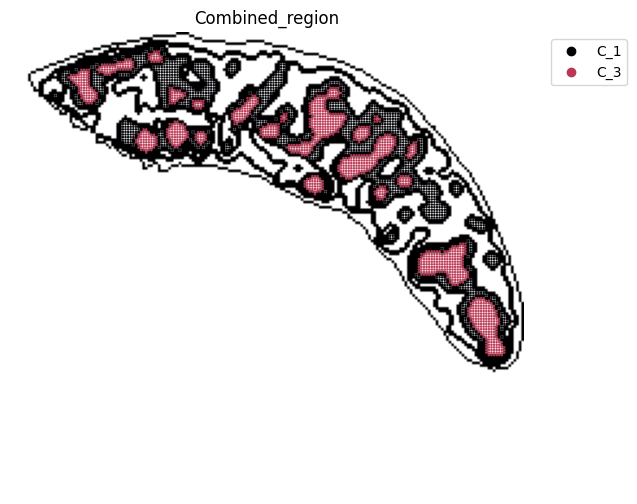

<Figure size 640x480 with 0 Axes>

In [15]:
fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    adata_RNA[adata_RNA.obs["Combined_region"].isin(["C_1", "C_3"]), :],
    space="spatial_bin100",
    color=["Combined_region"],
    alpha=0.95,
    pointsize=0.05,
    figsize=(4, 3),
    show_legend="upper left",
    img_layers = "layer1",
    slices="slice1",
    color_key = adata_RNA.uns['Combined_region_colors'],
    ax = ax,
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_spatial_domains_C1_C3.png"))

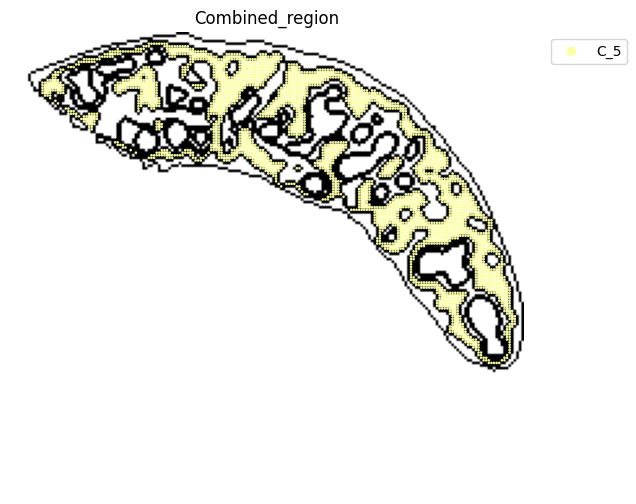

<Figure size 640x480 with 0 Axes>

In [16]:
fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    adata_RNA[adata_RNA.obs["Combined_region"].isin(["C_5"]), :],
    space="spatial_bin100",
    color=["Combined_region"],
    alpha=0.95,
    pointsize=0.05,
    figsize=(4, 3),
    show_legend="upper left",
    img_layers = "layer1",
    slices="slice1",
    color_key = adata_RNA.uns['Combined_region_colors'],
    ax = ax,
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_spatial_domains_C5.png"))

## Exploration of protein and RNA library size and feature autocorrelations

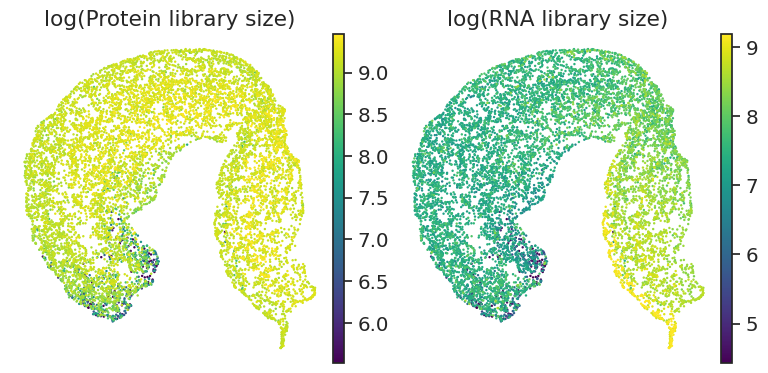

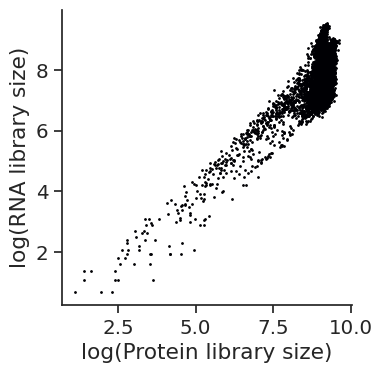

In [104]:
########### Exploration of protein and RNA library size and feature autocorrelations
import os
import seaborn as sns
import numpy as np
import scanpy as sc
import pandas as pd

# from scvi.dataset import CellMeasurement, AnnDatasetFromAnnData, GeneExpressionDataset
import matplotlib.pyplot as plt

# ######## save raw data
data_path = "/home/project/11003054/changxu/Data/Stereo_cite_seq/C03833D6"
data_name = "C03833D6_bin100"
adata_RNA = sc.read(os.path.join(data_path, 'Data', f"{data_name}_RNA.h5ad"))
adata_Protein = sc.read(os.path.join(data_path, 'Data', f"{data_name}_Protein.h5ad"))

save_path = '/home/users/nus/changxu/scratch/section5/Results/C03833D6_bin100_Dirac/20240925142432'
data = sc.read_h5ad(os.path.join(save_path, "C03833D6_bin100_Dirac_RNA_20240925142432.h5ad"))

# create a dictionary to map cluster to annotation label
cluster2annotation = {
    "C_1": "Marginal zone",
    "C_2": "Capsule",
    "C_3": "White pulp",
    "C_4": "Blood vessel",
    "C_5": "Red pulp",
}

# add a new `.obs` column called `cell type` by mapping clusters to annotation using pandas `map` function
data.obs["region domain"] = data.obs['Combined_region'].map(cluster2annotation).astype("category")

########### save colors
cluster2colors = {
    "Marginal zone": '#000004ff',
    "Capsule": '#57106eff',
    "White pulp": '#bc3754ff',
    "Blood vessel":'#f98e09ff',
    "Red pulp":'#fcffa4ff',
}

adata_RNA = adata_RNA[data.obs_names]
adata_Protein = adata_Protein[data.obs_names]

# Add log library size to adata
adata = adata_RNA.copy()
adata.obsm["protein_expression"] = adata_Protein.X
adata.obs = data.obs

# Add log library size to adata
adata.obs["loglibrary_protein"] = np.log1p(adata.obsm["protein_expression"].sum(axis=1))
adata.obs["loglibrary_RNA"] = np.log1p(adata.X.sum(axis=1))

adata.obsm["Dirac_embed"] = data.obsm["combine_recon"]
# Plot library sizes on UMAP
sc.pp.neighbors(adata, use_rep="Dirac_embed")
sc.tl.umap(adata)

fig, ax_arr = plt.subplots(1,2, figsize = (4*2, 4))
title_arr = ["log(Protein library size)", "log(RNA library size)"]


for i, feature in enumerate(['loglibrary_protein', "loglibrary_RNA"]):
    sc.pl.umap(
        adata, 
        use_raw = False,
        color=feature, 
        ncols=1, 
        color_map = "viridis",
        frameon = False,
        ax = ax_arr.flat[i],
        vmax = "p99",
        vmin = "p1",
        show = False,
        title = title_arr[i]
    )


plt.tight_layout()
fig.savefig(os.path.join(save_path,"Correlations", f"{data_name}_libsize_UMAP.pdf"), dpi = 300)


# Plot RNA vs protein library size

fig, ax = plt.subplots(figsize = (4,4))

ax.scatter(adata.obs["loglibrary_protein"], adata.obs["loglibrary_RNA"],
    s = 1, rasterized = True 
          )

ax.set(xlabel = "log(Protein library size)")
ax.set(ylabel = "log(RNA library size)")

sns.despine()
plt.tight_layout()

fig.savefig(os.path.join(save_path,"Correlations", f"{data_name}_libsize_RNA_protein_corr.pdf"), dpi = 300)


In [91]:
adata.obs["region domain"]

3006477123100     Capsule
3006477123200     Capsule
3006477123300     Capsule
3435973852500     Capsule
3435973852600     Capsule
                   ...   
84610855738100    Capsule
84610855738200    Capsule
84610855738300    Capsule
84610855738400    Capsule
84610855738500    Capsule
Name: region domain, Length: 9895, dtype: category
Categories (5, object): ['Marginal zone', 'Capsule', 'White pulp', 'Blood vessel', 'Red pulp']

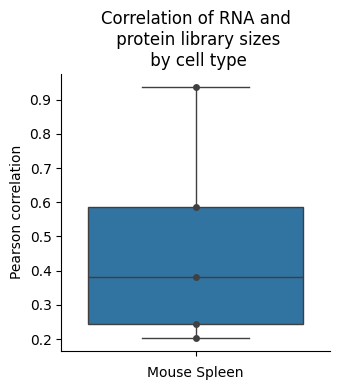

In [92]:
len(adata.obs["region domain"].cat.categories)
RNA_protein_corr = np.corrcoef(x = adata.obs["loglibrary_protein"], 
                               y = adata.obs["loglibrary_RNA"],
                               rowvar = False)

RNA_protein_corr


# Cells per cell type (exclude Plasma B from below analysis because there are too few cells to calculate a correlation)

pd.Series(adata.obs["region domain"]).value_counts()


# Find correlation in each annotated cell type

cell_types = adata.obs["region domain"].cat.categories
corrs = []
included_types = []

for cell_type in cell_types:
    corr = np.corrcoef(x = (adata[np.array(adata.obs["region domain"] == cell_type)].obs["loglibrary_protein"]), 
                               y = (adata[np.array(adata.obs["region domain"] == cell_type)].obs["loglibrary_RNA"]),
                               rowvar = False)[0][1]
    corrs = corrs + [corr]



pd.DataFrame({"cell_type": cell_types, "library_corr": corrs})


# Same as above, but swarmplot
fig, ax = plt.subplots(figsize = (3.5, 4))

ax = sns.boxplot(corrs, orient = "v")
ax = sns.swarmplot(corrs, orient = "v", color = "0.25") # data=tips, color=".25"


ax.set(xlabel = "Mouse Spleen")
ax.set(ylabel = "Pearson correlation")
ax.set(title = "Correlation of RNA and\n protein library sizes\n by cell type") # "RNA-protein library size\n correlation by cell type") #

sns.despine()
plt.tight_layout()

fig.savefig(os.path.join(save_path,"Correlations", f"{data_name}_libsize_celltype_boxplot.pdf"), dpi = 300)

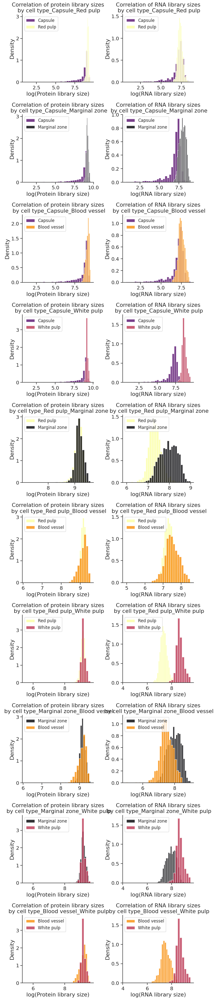

In [95]:
colors = ['#000004ff','#57106eff','#bc3754ff','#f98e09ff','#fcffa4ff',]

cluster2colors = {
    "Marginal zone": '#000004ff',
    "Capsule": '#57106eff',
    "White pulp": '#bc3754ff',
    "Blood vessel":'#f98e09ff',
    "Red pulp":'#fcffa4ff',
}

sns.set(context="notebook", font_scale=1.3, style="ticks")
sns.set_palette(sns.color_palette(colors))
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['savefig.transparent'] = True
sc.settings._vector_friendly = True
DPI = 300

import itertools
Bcell_clust_onevall = adata.obs["region domain"].unique().tolist()
# 生成所有两两组合
cell_type_pairs = list(itertools.combinations(Bcell_clust_onevall, 2))

fig, ax = plt.subplots(len(cell_type_pairs), 2, figsize=(8, 4 * len(cell_type_pairs)))
nbins = 30

for i, (cell_type_1, cell_type_2) in enumerate(cell_type_pairs):
    string_pairs = '{}_{}'.format(cell_type_1, cell_type_2)
    color1 = cluster2colors.get(cell_type_1, colors[0]) 
    color2 = cluster2colors.get(cell_type_2, colors[1]) 
    ax[i, 0].hist(adata[np.array(adata.obs["region domain"] == cell_type_1)].obs["loglibrary_protein"],
                  color=color1, alpha=0.8, bins=nbins, density=True)
    ax[i, 0].hist(adata[np.array(adata.obs["region domain"] == cell_type_2)].obs["loglibrary_protein"],
                  color=color2, alpha=0.8, bins=nbins, density=True)
    ax[i, 0].set(xlabel="log(Protein library size)")
    ax[i, 0].set(ylabel="Density")
    ax[i, 0].legend([cell_type_1, cell_type_2], prop={'size': 12}, loc='upper left')
    ax[i, 0].set(title = f"Correlation of protein library sizes\n by cell type_{string_pairs}")
    

    ax[i, 1].hist(adata[np.array(adata.obs["region domain"] == cell_type_1)].obs["loglibrary_RNA"],
                  color=color1, alpha=0.8, bins=nbins, density=True)
    ax[i, 1].hist(adata[np.array(adata.obs["region domain"] == cell_type_2)].obs["loglibrary_RNA"],
                  color=color2, alpha=0.8, bins=nbins, density=True)
    ax[i, 1].set(xlabel="log(RNA library size)")
    ax[i, 1].set(ylabel="Density")
    ax[i, 1].legend([cell_type_1, cell_type_2], prop={'size': 12}, loc='upper left')
    ax[i, 1].set(title = f"Correlation of RNA library sizes\n by cell type_{string_pairs}")

sns.despine()
plt.tight_layout()
fig.savefig(os.path.join(save_path, "Correlations", f"{data_name}_libsize_comparisons.pdf"), dpi=300)


In [96]:
# Geary's C from scanpy
# https://github.com/ivirshup/scanpy/blob/metrics/scanpy/metrics/_gearys_c.py

from typing import Optional, Union

from anndata import AnnData
from multipledispatch import dispatch
import numba
# import numpy as np
# import pandas as pd
from scipy import sparse


def _choose_obs_rep(adata, *, use_raw=False, layer=None, obsm=None, obsp=None):
    """
    Choose array aligned with obs annotation.
    """
    is_layer = layer is not None
    is_raw = use_raw is not False
    is_obsm = obsm is not None
    is_obsp = obsp is not None
    choices_made = sum((is_layer, is_raw, is_obsm, is_obsp))
    assert choices_made <= 1
    if choices_made == 0:
        return adata.X
    elif is_layer:
        return adata.layers[layer]
    elif use_raw:
        return adata.raw.X
    elif is_obsm:
        return adata.obsm[obsm]
    elif is_obsp:
        return adata.obsp[obsp]
    else:
        assert False, (
            "That was unexpected. Please report this bug at:\n\n\t"
            " https://github.com/theislab/scanpy/issues"
        )



###############################################################################
# Calculation
###############################################################################
# Some notes on the implementation:
# * This could be phrased as tensor multiplication. However that does not get
#   parallelized, which boosts performance almost linearly with cores.
# * Due to the umap setting the default threading backend, a parallel numba
#   function that calls another parallel numba function can get stuck. This
#   ends up meaning code re-use will be limited until umap 0.4.
#   See: https://github.com/lmcinnes/umap/issues/306
# * There can be a fair amount of numerical instability here (big reductions),
#   so data is cast to float64. Removing these casts/ conversion will cause the
#   tests to fail.


@numba.njit(cache=True, parallel=False)
def _gearys_c_vec(data, indices, indptr, x):
    W = data.sum()
    return _gearys_c_vec_W(data, indices, indptr, x, W)


@numba.njit(cache=True, parallel=False)
def _gearys_c_vec_W(data, indices, indptr, x, W):
    N = len(indptr) - 1
    x_bar = x.mean()
    x = x.astype(np.float_)

    total = 0.0
    for i in numba.prange(N):
        s = slice(indptr[i], indptr[i + 1])
        i_indices = indices[s]
        i_data = data[s]
        total += np.sum(i_data * ((x[i] - x[i_indices]) ** 2))

    numer = (N - 1) * total
    denom = 2 * W * ((x - x_bar) ** 2).sum()
    C = numer / denom

    return C


@numba.njit(cache=True, parallel=False)
def _gearys_c_mtx_csr(
    g_data, g_indices, g_indptr, x_data, x_indices, x_indptr, x_shape
):
    M, N = x_shape
    W = g_data.sum()
    out = np.zeros(M, dtype=np.float_)
    for k in numba.prange(M):
        x_k = np.zeros(N, dtype=np.float_)
        sk = slice(x_indptr[k], x_indptr[k + 1])
        x_k_data = x_data[sk]
        x_k[x_indices[sk]] = x_k_data
        x_k_bar = np.sum(x_k_data) / N
        total = 0.0
        for i in numba.prange(N):
            s = slice(g_indptr[i], g_indptr[i + 1])
            i_indices = g_indices[s]
            i_data = g_data[s]
            total += np.sum(i_data * ((x_k[i] - x_k[i_indices]) ** 2))
        numer = (N - 1) * total
        # Expanded from 2 * W * ((x_k - x_k_bar) ** 2).sum(), but uses sparsity
        # to skip some calculations
        # fmt: off
        denom = (
            2 * W
            * (
                np.sum(x_k_data ** 2)
                - np.sum(x_k_data * x_k_bar * 2)
                + (x_k_bar ** 2) * N
            )
        )
        C = numer / denom
        out[k] = C
    return out


# Simplified implementation, hits race condition after umap import due to numba
# parallel backend
# @numba.njit(cache=True, parallel=False)
# def _gearys_c_mtx_csr(
#     g_data, g_indices, g_indptr, x_data, x_indices, x_indptr, x_shape
# ):
#     M, N = x_shape
#     W = g_data.sum()
#     out = np.zeros(M, dtype=np.float64)
#     for k in numba.prange(M):
#         x_arr = np.zeros(N, dtype=x_data.dtype)
#         sk = slice(x_indptr[k], x_indptr[k + 1])
#         x_arr[x_indices[sk]] = x_data[sk]
#         outval = _gearys_c_vec_W(g_data, g_indices, g_indptr, x_arr, W)
#         out[k] = outval
#     return out


@numba.njit(cache=True, parallel=False)
def _gearys_c_mtx(g_data, g_indices, g_indptr, X):
    M, N = X.shape
    W = g_data.sum()
    out = np.zeros(M, dtype=np.float_)
    for k in numba.prange(M):
        x = X[k, :].astype(np.float_)
        x_bar = x.mean()

        total = 0.0
        for i in numba.prange(N):
            s = slice(g_indptr[i], g_indptr[i + 1])
            i_indices = g_indices[s]
            i_data = g_data[s]
            total += np.sum(i_data * ((x[i] - x[i_indices]) ** 2))

        numer = (N - 1) * total
        denom = 2 * W * ((x - x_bar) ** 2).sum()
        C = numer / denom

        out[k] = C
    return out


# Similar to above, simplified version umaps choice of parallel backend breaks:
# @numba.njit(cache=True, parallel=False)
# def _gearys_c_mtx(g_data, g_indices, g_indptr, X):
#     M, N = X.shape
#     W = g_data.sum()
#     out = np.zeros(M, dtype=np.float64)
#     for k in numba.prange(M):
#         outval = _gearys_c_vec_W(g_data, g_indices, g_indptr, X[k, :], W)
#         out[k] = outval
#     return out


###############################################################################
# Interface
###############################################################################


@dispatch(sparse.csr_matrix, sparse.csr_matrix)
def gearys_c(g, vals) -> np.ndarray:
    assert g.shape[0] == g.shape[1], "`g` should be a square adjacency matrix"
    assert g.shape[0] == vals.shape[1]
    return _gearys_c_mtx_csr(
        g.data.astype(np.float_, copy=False),
        g.indices,
        g.indptr,
        vals.data.astype(np.float_, copy=False),
        vals.indices,
        vals.indptr,
        vals.shape,
    )


@dispatch(sparse.spmatrix, np.ndarray)  # noqa
def gearys_c(g, vals):
    """\
    Params
    ------
    g
        Connectivity graph as a scipy sparse matrix. Should have shape:
        `(n_obs, n_obs)`.
    vals
        Values to calculate Geary's C for. If one dimensional, should have
        shape `(n_obs,)`. If two dimensional (i.e calculating Geary's C for
        multiple variables) should have shape `(n_vars, n_obs)`.
    """
    assert g.shape[0] == g.shape[1], "`g` should be a square matrix."
    if not isinstance(g, sparse.csr_matrix):
        g = g.tocsr()
    g_data = g.data.astype(np.float_, copy=False)
    if vals.ndim == 1:
        assert g.shape[0] == vals.shape[0]
        return _gearys_c_vec(g_data, g.indices, g.indptr, vals)
    elif vals.ndim == 2:
        assert g.shape[0] == vals.shape[1]
        return _gearys_c_mtx(g_data, g.indices, g.indptr, vals)
    else:
        raise ValueError()


@dispatch(sparse.spmatrix, (pd.DataFrame, pd.Series))  # noqa
def gearys_c(g, vals):
    return gearys_c(g, vals.values)


@dispatch(sparse.spmatrix, sparse.spmatrix)  # noqa
def gearys_c(g, vals) -> np.ndarray:
    if not isinstance(g, sparse.csr_matrix):
        g = g.tocsr()
    if not isinstance(vals, sparse.csr_matrix):
        vals = vals.tocsr()
    return gearys_c(g, vals)


# TODO: Document better
# TODO: Have scanpydoc work with multipledispatch
@dispatch(AnnData)  # noqa
def gearys_c(
    adata: AnnData,
    *,
    vals: Optional[Union[np.ndarray, sparse.spmatrix]] = None,
    use_graph: Optional[str] = None,
    layer: Optional[str] = None,
    obsm: Optional[str] = None,
    obsp: Optional[str] = None,
    use_raw: bool = False,
) -> Union[np.ndarray, float]:
    """\
    Calculate `Geary's C` <https://en.wikipedia.org/wiki/Geary's_C>`_, as used
    by `VISION <https://doi.org/10.1038/s41467-019-12235-0>`_.
    Geary's C is a measure of autocorrelation for some measure on a graph. This
    can be to whether measures are correlated between neighboring cells. Lower
    values indicate greater correlation.
    ..math
        C =
        \frac{
            (N - 1)\sum_{i,j} w_{i,j} (x_i - x_j)^2
        }{
            2W \sum_i (x_i - \bar{x})^2
        }
    Params
    ------
    adata
    vals
        Values to calculate Geary's C for. If this is two dimensional, should
        be of shape `(n_features, n_cells)`. Otherwise should be of shape
        `(n_cells,)`. This matrix can be selected from elements of the anndata
        object by using key word arguments: `layer`, `obsm`, `obsp`, or
        `use_raw`.
    use_graph
        Key to use for graph in anndata object. If not provided, default
        neighbors connectivities will be used instead.
    layer
        Key for `adata.layers` to choose `vals`.
    obsm
        Key for `adata.obsm` to choose `vals`.
    obsp
        Key for `adata.obsp` to choose `vals`.
    use_raw
        Whether to use `adata.raw.X` for `vals`.
    Returns
    -------
    If vals is two dimensional, returns a 1 dimensional ndarray array. Returns
    a scalar if `vals` is 1d.
    """
    if use_graph is None:
        # Fix for anndata<0.7
        if hasattr(adata, "obsp") and "connectivities" in adata.obsp:
            g = adata.obsp["connectivities"]
        elif "neighbors" in adata.uns:
            g = adata.uns["neighbors"]["connectivities"]
        else:
            raise ValueError("Must run neighbors first.")
    else:
        raise NotImplementedError()
    if vals is None:
        vals = _choose_obs_rep(
            adata, use_raw=use_raw, layer=layer, obsm=obsm, obsp=obsp
        ).T
    return gearys_c(g, vals)

In [105]:
###### drop capsule
# adata = adata[~adata.obs["region domain"].isin(['Capsule'])]
# Autocorrelation of library size in latent space
# Calculate Geary's C in totalVI latent space
sc.pp.neighbors(adata, use_rep="Dirac_embed", n_neighbors=15) #, metric="correlation"
# https://github.com/adamgayoso/totalVI_journal/blob/master/spleen_lymph_all/run_sln_all.py
adata.obsp["connectivities"].shape
# All cells RNA
print(gearys_c(adata.obsp["connectivities"], adata.obs["loglibrary_RNA"]))
# All cells protein
print(gearys_c(adata.obsp["connectivities"], adata.obs["loglibrary_protein"]))

0.32831765607402164
0.4603684313268376


In [106]:
# All clusters RNA
rna_geary_clusters = []
protein_geary_clusters = []
for cluster in adata.obs["region domain"].cat.categories:
    sub_adata = adata[np.array(adata.obs["region domain"] == cluster)]
    geary_clust_r = gearys_c(sub_adata.obsp["connectivities"], sub_adata.obs["loglibrary_RNA"])
    geary_clust_p = gearys_c(sub_adata.obsp["connectivities"], sub_adata.obs["loglibrary_protein"])

    rna_geary_clusters.append(geary_clust_r)
    protein_geary_clusters.append(geary_clust_p)


gearyC_clusters = adata.obs["region domain"].cat.categories
gearyC_results = pd.DataFrame({"cell_type": adata.obs["region domain"].cat.categories,
             "RNA_gearyC": rna_geary_clusters,
             "protein_gearyC": protein_geary_clusters})

gearyC_results.to_csv(os.path.join(save_path, 'Correlations',"gearyC_totalVI.csv"))

np.sum(gearyC_results["RNA_gearyC"] > gearyC_results["protein_gearyC"])
len(gearyC_results)

5

In [107]:
gearyC_results

,cell_type,RNA_gearyC,protein_gearyC
0,Marginal zone,0.476760,0.668526
1,Capsule,0.671377,0.602679
2,White pulp,0.475874,0.686322
3,Blood vessel,0.515817,0.509684
4,Red pulp,0.671701,0.649506


/tmp/ipykernel_4073359/1970345963.py:20: UserWarning:

The palette list has more values (6) than needed (2), which may not be intended.



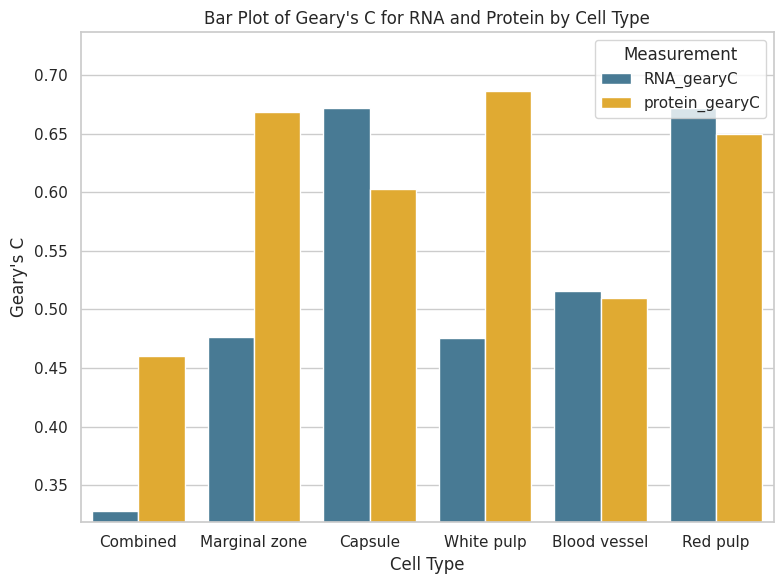

In [109]:
# Sample data
data = {
    'cell_type': ['Combined', 'Marginal zone', 'Capsule', 'White pulp', 'Blood vessel', 'Red pulp'],
    'RNA_gearyC': [0.328318, 0.476760, 0.671377, 0.475874, 0.515817, 0.671701],
    'protein_gearyC': [0.460368, 0.668526, 0.602679, 0.686322, 0.509684, 0.649506]
}

# Convert to DataFrame
df = pd.DataFrame(data)

# Melt DataFrame to long format for better plotting
df_melted = df.melt(id_vars='cell_type', var_name='Measurement', value_name='GearyC')

# Set up the plot
plt.figure(figsize=(8, 6))
sns.set(style="whitegrid")
colors = ["#3B7EA1", "#FDB515", "#D9661F", "#859438", "#EE1F60", "#00A598"]  # You can choose your colors

# Create barplot
bar_plot = sns.barplot(x='cell_type', y='GearyC', hue='Measurement', data=df_melted, palette=colors)

# Customize plot
plt.xlabel('Cell Type')
plt.ylabel('Geary\'s C')
plt.title('Bar Plot of Geary\'s C for RNA and Protein by Cell Type')
plt.legend(title='Measurement')

# Set y-axis limits
min_y = df_melted['GearyC'].min() - 0.01  # Adjust as needed
max_y = df_melted['GearyC'].max() + 0.05  # Adjust as needed
plt.ylim(min_y, max_y)

plt.tight_layout()

# Save the plot
plt.savefig(os.path.join(save_path, "Correlations", f"{data_name}_Gearys_RNA_protein.pdf"), dpi=300)
plt.show()

In [110]:
# Autocorrelation of features in different latent spaces
# For each protein and RNA feature, calculate the autocorrelation in three different latent spaces:
# totalVI
# RNA only (scVI)
# protein only (PCA)
import os
import seaborn as sns
import numpy as np
import scanpy as sc
import pandas as pd

# from scvi.dataset import CellMeasurement, AnnDatasetFromAnnData, GeneExpressionDataset
import matplotlib.pyplot as plt

data_path = "/home/project/11003054/changxu/Data/Stereo_cite_seq/C03833D6"
data_name = "C03833D6_bin100"
save_path = '/home/users/nus/changxu/scratch/section5/Results/C03833D6_bin100_Dirac/20240925142432'
adata_RNA = sc.read(os.path.join(data_path, 'Data', f"{data_name}_RNA.h5ad"))
adata_Protein = sc.read(os.path.join(data_path, 'Data', f"{data_name}_Protein.h5ad"))


RNA = sc.read(os.path.join(save_path,'C03833D6_bin100_Dirac_RNA_20240925142432.h5ad'))
Protein = sc.read(os.path.join(save_path,'C03833D6_bin100_Dirac_Protein_20240925142432.h5ad'))

######## 取交集
adata_RNA = adata_RNA[RNA.obs_names, RNA.var_names]
adata_Protein = adata_Protein[Protein.obs_names]

adata_RNA.obsm["Dirac_embed_RNA"] = RNA.obsm["Dirac_embed"].copy()
adata_Protein.obsm["Dirac_embed_Protein"] = Protein.obsm["Dirac_embed"].copy()

adata_RNA.obsm["Dirac_embed"] = RNA.obsm["combine_recon"].copy()
adata_Protein.obsm["Dirac_embed"] = RNA.obsm["combine_recon"].copy()

# Add log library size to adata
adata = adata_RNA.copy()
adata.obsm["protein_expression"] = adata_Protein.X
adata.obs = RNA.obs

# Add log library size to adata
adata.obs["loglibrary_protein"] = np.log1p(adata.obsm["protein_expression"].sum(axis=1))
adata.obs["loglibrary_RNA"] = np.log1p(adata.X.sum(axis=1))

adata.obsm["Dirac_embed_RNA"] = RNA.obsm["Dirac_embed"].copy()
adata.obsm["Dirac_embed_Protein"] = Protein.obsm["Dirac_embed"].copy()
adata.obsm['Dirac_embed'] = RNA.obsm["combine_recon"].copy()


total_dirac_rna_gearyc = []
total_dirac_protein_gearyc = []
# adata.raw = adata.copy()

sc.pp.filter_genes(adata_RNA, min_cells=3)
sc.pp.normalize_total(adata_RNA, target_sum=1e4)
sc.pp.log1p(adata_RNA)
sc.pp.scale(adata_RNA)
sc.pp.pca(adata_RNA)
sc.pp.neighbors(adata_RNA, use_rep="X_pca")


#total
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.X = adata.X.toarray()
adata.obsm["protein_expression"] = adata.obsm["protein_expression"].toarray()
sc.pp.neighbors(adata, use_rep='Dirac_embed')

# Protein
sc.pp.normalize_total(adata_Protein, target_sum=1e4)
sc.pp.log1p(adata_Protein)
sc.pp.scale(adata_Protein)
sc.pp.pca(adata_Protein)
sc.pp.neighbors(adata_Protein, use_rep="X_pca")


####### Total
for i in range(adata.X.shape[1]):
    expr = np.array(adata.X[:, i]) # log-library size normalized RNA
    autocor = gearys_c(adata.obsp["connectivities"], expr)
    total_dirac_rna_gearyc.append(autocor)


for i in range(adata_Protein.X.shape[1]):
    expr = np.log1p(np.array(adata.obsm["protein_expression"][:, i]))  # log(raw protein)
    autocor = gearys_c(adata.obsp["connectivities"], expr)
    total_dirac_protein_gearyc.append(autocor)


/tmp/ipykernel_4073359/1634716134.py:29: ImplicitModificationWarning:

Setting element `.obsm['Dirac_embed_RNA']` of view, initializing view as actual.

/tmp/ipykernel_4073359/1634716134.py:30: ImplicitModificationWarning:

Setting element `.obsm['Dirac_embed_Protein']` of view, initializing view as actual.



In [111]:
# joint latent space from totalVI (post_adata)
RNA_dirac_rna_gearyc = []
RNA_dirac_protein_gearyc = []


for i in range(adata.X.shape[1]):
    expr = np.array(adata.X[:, i]) # log-library size normalized RNA
    autocor = gearys_c(adata_RNA.obsp["connectivities"], expr)
    RNA_dirac_rna_gearyc.append(autocor)

# Protein
for i in range(adata_Protein.X.shape[1]):
    expr = np.log1p(np.array(adata.obsm["protein_expression"][:, i]))  # log(raw protein)
    autocor = gearys_c(adata_RNA.obsp["connectivities"], expr)
    RNA_dirac_protein_gearyc.append(autocor)


# protein only latent space (PCA)

Protein_dirac_rna_gearyc = []
Protein_dirac_protein_gearyc = []


for i in range(adata.X.shape[1]):
    expr = np.array(adata.X[:, i]) # log-library size normalized RNA
    autocor = gearys_c(adata_Protein.obsp["connectivities"], expr)
    Protein_dirac_rna_gearyc.append(autocor)

# Protein
for i in range(adata_Protein.X.shape[1]):
    expr = np.log1p(np.array(adata.obsm["protein_expression"][:, i]))  # log(raw protein)
    autocor = gearys_c(adata_Protein.obsp["connectivities"], expr)
    Protein_dirac_protein_gearyc.append(autocor)

In [112]:
gearyc_latentprotein = pd.DataFrame({"Joint\n (Dirac)": total_dirac_protein_gearyc, 
                              "RNA only\n (Dirac)": RNA_dirac_protein_gearyc,
                              "Protein only\n (Dirac)": Protein_dirac_protein_gearyc})

gearyc_latentrna =  pd.DataFrame({"Joint\n (Dirac)": total_dirac_rna_gearyc,
                             "RNA only\n (Dirac)": RNA_dirac_rna_gearyc,
                             "Protein only\n (Dirac)": Protein_dirac_rna_gearyc})

gearyc_latentprotein.to_csv(os.path.join(save_path, "Correlations", f"{data_name}_gearyc_latentprotein.csv"))
gearyc_latentrna.to_csv(os.path.join(save_path, "Correlations", f"{data_name}_gearyc_latentrna.csv"))

# Calculate spearman correlations between latent space autocorrelations

from scipy.stats import spearmanr
from scipy.stats import pearsonr
from scipy.stats import ttest_ind
from scipy.stats import sem
from scipy.stats import ranksums

# Protein 
print("Total vs RNA")
print(ranksums(gearyc_latentprotein.iloc[:, 0],
        gearyc_latentprotein.iloc[:, 1]))


print("RNA vs Protein")

print(ranksums(gearyc_latentprotein.iloc[:, 1],
        gearyc_latentprotein.iloc[:, 2]))

print("Total vs Protein")

print(ranksums(gearyc_latentprotein.iloc[:, 0],
        gearyc_latentprotein.iloc[:, 2]))

Total vs RNA
RanksumsResult(statistic=5.932200878706064, pvalue=2.989006064347974e-09)
RNA vs Protein
RanksumsResult(statistic=0.40853517719034366, pvalue=0.6828808101876889)
Total vs Protein
RanksumsResult(statistic=8.584303206664867, pvalue=9.138864434408813e-18)


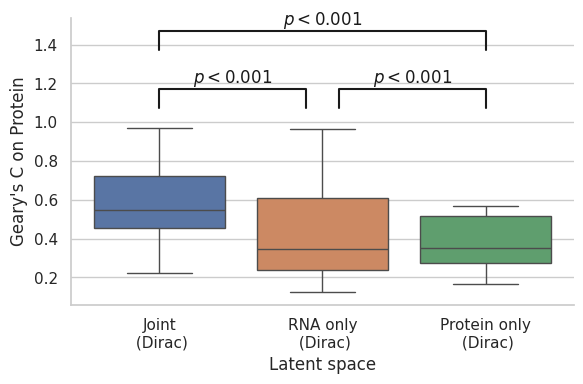

In [113]:
# Plot for protein

fig, ax = plt.subplots(figsize = (6, 4))

ax = sns.boxplot(data = gearyc_latentprotein, orient = "v")
ax.set(xlabel = "Latent space")
ax.set(ylabel = "Geary's C on Protein")

sns.despine()
plt.tight_layout()

# statistical annotation
x1, x2 = 0, 0.9
y, h, col = gearyc_latentprotein.iloc[:, 0].max() + .1, .1, 'k'
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
ax.text((x1+x2)*.5, y+h, r"$p<0.001$", ha='center', va='bottom', color=col)

x1, x2 = 1.1, 2
y, h, col = gearyc_latentprotein.iloc[:, 0].max() + .1, .1, 'k'
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
ax.text((x1+x2)*.5, y+h, r"$p<0.001$", ha='center', va='bottom', color=col)

x1, x2 = 0, 2
y, h, col = gearyc_latentprotein.iloc[:, 0].max() + .4, .1, 'k'
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
ax.text((x1+x2)*.5, y+h, r"$p<0.001$", ha='center', va='bottom', color=col)

plt.tight_layout()
fig.savefig(os.path.join(save_path, "Correlations", f"{data_name}_jointmodel_autocorrelation_protein.pdf"), dpi=300)

In [114]:
# RNA

print("totalVI vs scVI")
print(ranksums(gearyc_latentrna.iloc[:, 0],
        gearyc_latentrna.iloc[:, 1]))


print("scVI vs protein")

print(ranksums(gearyc_latentrna.iloc[:, 1],
        gearyc_latentrna.iloc[:, 2]))

print("totalVI vs protein")

print(ranksums(gearyc_latentrna.iloc[:, 0],
        gearyc_latentrna.iloc[:, 2]))

totalVI vs scVI
RanksumsResult(statistic=94.99736856589915, pvalue=0.0)
scVI vs protein
RanksumsResult(statistic=-64.57225629857335, pvalue=0.0)
totalVI vs protein
RanksumsResult(statistic=17.391183676396867, pvalue=9.622627371084836e-68)


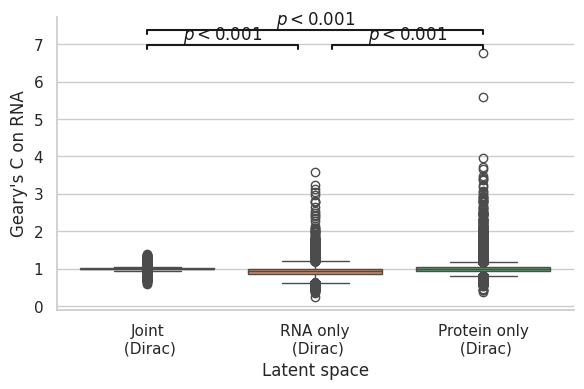

In [115]:
# Plot for RNA

fig, ax = plt.subplots(figsize = (6, 4))

ax = sns.boxplot(data = gearyc_latentrna, orient = "v")
ax.set(xlabel = "Latent space")
ax.set(ylabel = "Geary's C on RNA")

sns.despine()
plt.tight_layout()

# statistical annotation
x1, x2 = 0, 0.9
y, h, col = gearyc_latentrna.iloc[:, 2].max() + .1, .1, 'k'
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
ax.text((x1+x2)*.5, y+h, r"$p<0.001$", ha='center', va='bottom', color=col)

x1, x2 = 1.1, 2
y, h, col = gearyc_latentrna.iloc[:, 2].max() + .1, .1, 'k'
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
ax.text((x1+x2)*.5, y+h, r"$p<0.001$", ha='center', va='bottom', color=col)

x1, x2 = 0, 2
y, h, col = gearyc_latentrna.iloc[:, 2].max() + .5, .1, 'k'
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
ax.text((x1+x2)*.5, y+h, r"$p<0.001$", ha='center', va='bottom', color=col)
fig.savefig(os.path.join(save_path, "Correlations", f"{data_name}_jointmodel_autocorrelation_rna.pdf"), dpi=300)

In [140]:
# Autocorrelation of features in different latent spaces
# For each protein and RNA feature, calculate the autocorrelation in three different latent spaces:
# totalVI
# RNA only (scVI)
# protein only (PCA)
import os
import seaborn as sns
import numpy as np
import scanpy as sc
import pandas as pd

# from scvi.dataset import CellMeasurement, AnnDatasetFromAnnData, GeneExpressionDataset
import matplotlib.pyplot as plt

data_path = "/home/project/11003054/changxu/Data/Stereo_cite_seq/C03833D6"
data_name = "C03833D6_bin100"
save_path = '/home/users/nus/changxu/scratch/section5/Results/C03833D6_bin100_Dirac/20240925142432'
adata_RNA = sc.read(os.path.join(data_path, 'Data', f"{data_name}_RNA.h5ad"))
adata_Protein = sc.read(os.path.join(data_path, 'Data', f"{data_name}_Protein.h5ad"))


RNA = sc.read(os.path.join(save_path,'C03833D6_bin100_Dirac_RNA_20240925142432.h5ad'))
Protein = sc.read(os.path.join(save_path,'C03833D6_bin100_Dirac_Protein_20240925142432.h5ad'))

######## 取交集
adata_RNA = adata_RNA[RNA.obs_names, RNA.var_names]
adata_Protein = adata_Protein[Protein.obs_names]

adata_RNA.obsm["Dirac_embed_RNA"] = RNA.obsm["Dirac_embed"].copy()
adata_Protein.obsm["Dirac_embed_Protein"] = Protein.obsm["Dirac_embed"].copy()

adata_RNA.obsm["Dirac_embed"] = RNA.obsm["combine_recon"].copy()
adata_Protein.obsm["Dirac_embed"] = RNA.obsm["combine_recon"].copy()

# Add log library size to adata
adata = adata_RNA.copy()
adata.obsm["protein_expression"] = adata_Protein.X
adata.obs = RNA.obs

# Add log library size to adata
adata.obs["loglibrary_protein"] = np.log1p(adata.obsm["protein_expression"].sum(axis=1))
adata.obs["loglibrary_RNA"] = np.log1p(adata.X.sum(axis=1))

adata.obsm["Dirac_embed_RNA"] = RNA.obsm["Dirac_embed"].copy()
adata.obsm["Dirac_embed_Protein"] = Protein.obsm["Dirac_embed"].copy()
adata.obsm['Dirac_embed'] = RNA.obsm["combine_recon"].copy()

# adata_RNA.write(os.path.join(save_path, 'Raw_adata', f"{data_name}_RNA.h5ad"), compression="gzip")
# adata_Protein.write(os.path.join(save_path, 'Raw_adata', f"{data_name}_Protein.h5ad"), compression="gzip")
# adata.write(os.path.join(save_path, 'Raw_adata', f"{data_name}_Combined.h5ad"), compression="gzip")

sc.pp.filter_genes(adata_RNA, min_cells=3)
sc.pp.normalize_total(adata_RNA, target_sum=1e4)
sc.pp.log1p(adata_RNA)
adata_RNA.X = adata_RNA.X.toarray()
sc.pp.neighbors(adata_RNA, use_rep="Dirac_embed_RNA")


# Protein
sc.pp.normalize_total(adata_Protein, target_sum=1e4)
sc.pp.log1p(adata_Protein)
adata_Protein.X = adata_Protein.X.toarray()
sc.pp.neighbors(adata_Protein, use_rep="Dirac_embed_Protein")

# Total
sc.pp.neighbors(adata, use_rep="Dirac_embed")

total_dirac_rna_gearyc = []
total_dirac_protein_gearyc = []
# adata.raw = adata.copy()
####### Total
for i in range(adata_RNA.X.shape[1]):
    expr = np.array(adata_RNA.X[:, i]) # log-library size normalized RNA
    autocor = gearys_c(adata.obsp["connectivities"], expr)
    total_dirac_rna_gearyc.append(autocor)


for i in range(adata_Protein.X.shape[1]):
    expr = np.array(adata_Protein.X[:, i])  # log(raw protein)
    autocor = gearys_c(adata.obsp["connectivities"], expr)
    total_dirac_protein_gearyc.append(autocor)

/tmp/ipykernel_4073359/1775837300.py:29: ImplicitModificationWarning:

Setting element `.obsm['Dirac_embed_RNA']` of view, initializing view as actual.

/tmp/ipykernel_4073359/1775837300.py:30: ImplicitModificationWarning:

Setting element `.obsm['Dirac_embed_Protein']` of view, initializing view as actual.



Total vs RNA
RanksumsResult(statistic=-4.080287286235788, pvalue=4.4980074429718275e-05)
RNA vs Protein
RanksumsResult(statistic=6.207371266648321, pvalue=5.387821092301907e-10)
Total vs Protein
RanksumsResult(statistic=3.2159483989570443, pvalue=0.0013001420732866266)
totalVI vs scVI
RanksumsResult(statistic=42.07773945674123, pvalue=0.0)
scVI vs protein
RanksumsResult(statistic=-40.15654431613034, pvalue=0.0)
totalVI vs protein
RanksumsResult(statistic=0.8244060141519517, pvalue=0.4097088987459152)


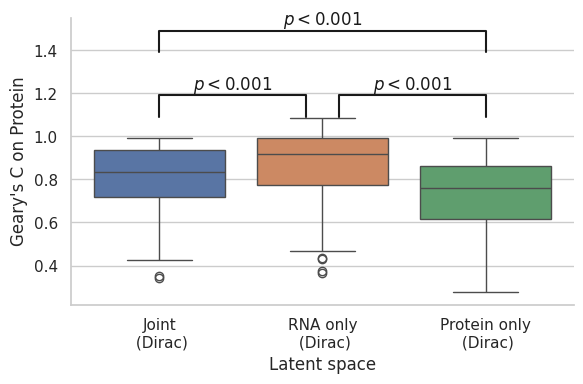

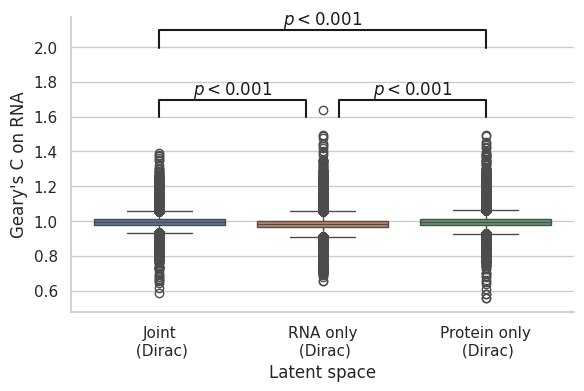

In [119]:
# joint latent space from totalVI (post_adata)
RNA_dirac_rna_gearyc = []
RNA_dirac_protein_gearyc = []

for i in range(adata_RNA.X.shape[1]):
    expr = np.array(adata_RNA.X[:, i]) # log-library size normalized RNA
    autocor = gearys_c(adata_RNA.obsp["connectivities"], expr)
    RNA_dirac_rna_gearyc.append(autocor)

# Protein
for i in range(adata_Protein.X.shape[1]):
    expr = np.array(adata_Protein.X[:, i])  # log(raw protein)
    autocor = gearys_c(adata_RNA.obsp["connectivities"], expr)
    RNA_dirac_protein_gearyc.append(autocor)


# protein only latent space (PCA)

Protein_dirac_rna_gearyc = []
Protein_dirac_protein_gearyc = []

for i in range(adata_RNA.X.shape[1]):
    expr = np.array(adata_RNA.X[:, i]) # log-library size normalized RNA
    autocor = gearys_c(adata_Protein.obsp["connectivities"], expr)
    Protein_dirac_rna_gearyc.append(autocor)

# Protein
for i in range(adata_Protein.X.shape[1]):
    expr = np.array(adata_Protein.X[:, i])  # log(raw protein)
    autocor = gearys_c(adata_Protein.obsp["connectivities"], expr)
    Protein_dirac_protein_gearyc.append(autocor)


gearyc_latentprotein = pd.DataFrame({"Joint\n (Dirac)": total_dirac_protein_gearyc, 
                              "RNA only\n (Dirac)": RNA_dirac_protein_gearyc,
                              "Protein only\n (Dirac)": Protein_dirac_protein_gearyc})

gearyc_latentrna =  pd.DataFrame({"Joint\n (Dirac)": total_dirac_rna_gearyc,
                             "RNA only\n (Dirac)": RNA_dirac_rna_gearyc,
                             "Protein only\n (Dirac)": Protein_dirac_rna_gearyc})

gearyc_latentprotein.to_csv(os.path.join(save_path, "Correlations", f"{data_name}_gearyc_latentprotein.csv"))
gearyc_latentrna.to_csv(os.path.join(save_path, "Correlations", f"{data_name}_gearyc_latentrna.csv"))

# Calculate spearman correlations between latent space autocorrelations

from scipy.stats import spearmanr
from scipy.stats import pearsonr
from scipy.stats import ttest_ind
from scipy.stats import sem
from scipy.stats import ranksums

# Protein 
print("Total vs RNA")
print(ranksums(gearyc_latentprotein.iloc[:, 0],
        gearyc_latentprotein.iloc[:, 1]))


print("RNA vs Protein")

print(ranksums(gearyc_latentprotein.iloc[:, 1],
        gearyc_latentprotein.iloc[:, 2]))

print("Total vs Protein")

print(ranksums(gearyc_latentprotein.iloc[:, 0],
        gearyc_latentprotein.iloc[:, 2]))


# Plot for protein

fig, ax = plt.subplots(figsize = (6, 4))

ax = sns.boxplot(data = gearyc_latentprotein, orient = "v")
ax.set(xlabel = "Latent space")
ax.set(ylabel = "Geary's C on Protein")

sns.despine()
plt.tight_layout()

# statistical annotation
x1, x2 = 0, 0.9
y, h, col = gearyc_latentprotein.iloc[:, 0].max() + .1, .1, 'k'
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
ax.text((x1+x2)*.5, y+h, r"$p<0.001$", ha='center', va='bottom', color=col)

x1, x2 = 1.1, 2
y, h, col = gearyc_latentprotein.iloc[:, 0].max() + .1, .1, 'k'
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
ax.text((x1+x2)*.5, y+h, r"$p<0.001$", ha='center', va='bottom', color=col)

x1, x2 = 0, 2
y, h, col = gearyc_latentprotein.iloc[:, 0].max() + .4, .1, 'k'
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
ax.text((x1+x2)*.5, y+h, r"$p<0.001$", ha='center', va='bottom', color=col)

plt.tight_layout()
fig.savefig(os.path.join(save_path, "Correlations", f"{data_name}_jointmodel_autocorrelation_protein.pdf"), dpi=300)


# RNA

print("totalVI vs scVI")
print(ranksums(gearyc_latentrna.iloc[:, 0],
        gearyc_latentrna.iloc[:, 1]))


print("scVI vs protein")

print(ranksums(gearyc_latentrna.iloc[:, 1],
        gearyc_latentrna.iloc[:, 2]))

print("totalVI vs protein")

print(ranksums(gearyc_latentrna.iloc[:, 0],
        gearyc_latentrna.iloc[:, 2]))

# Plot for RNA

fig, ax = plt.subplots(figsize = (6, 4))

ax = sns.boxplot(data = gearyc_latentrna, orient = "v")
ax.set(xlabel = "Latent space")
ax.set(ylabel = "Geary's C on RNA")

sns.despine()
plt.tight_layout()

# statistical annotation
x1, x2 = 0, 0.9
y, h, col = gearyc_latentrna.iloc[:, 2].max() + .1, .1, 'k'
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
ax.text((x1+x2)*.5, y+h, r"$p<0.001$", ha='center', va='bottom', color=col)

x1, x2 = 1.1, 2
y, h, col = gearyc_latentrna.iloc[:, 2].max() + .1, .1, 'k'
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
ax.text((x1+x2)*.5, y+h, r"$p<0.001$", ha='center', va='bottom', color=col)

x1, x2 = 0, 2
y, h, col = gearyc_latentrna.iloc[:, 2].max() + .5, .1, 'k'
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
ax.text((x1+x2)*.5, y+h, r"$p<0.001$", ha='center', va='bottom', color=col)
fig.savefig(os.path.join(save_path, "Correlations", f"{data_name}_jointmodel_autocorrelation_rna.pdf"), dpi=300)


In [147]:
#######画一个不一样的图。
# Autocorrelation of features in different latent spaces
# For each protein and RNA feature, calculate the autocorrelation in three different latent spaces:
# totalVI
# RNA only (scVI)
# protein only (PCA)
import os
import seaborn as sns
import numpy as np
import scanpy as sc
import pandas as pd

# from scvi.dataset import CellMeasurement, AnnDatasetFromAnnData, GeneExpressionDataset
import matplotlib.pyplot as plt

data_path = "/home/project/11003054/changxu/Data/Stereo_cite_seq/C03833D6"
data_name = "C03833D6_bin100"
save_path = '/home/users/nus/changxu/scratch/section5/Results/C03833D6_bin100_Dirac/20240925142432'
adata_RNA = sc.read(os.path.join(data_path, 'Data', f"{data_name}_RNA.h5ad"))
adata_Protein = sc.read(os.path.join(data_path, 'Data', f"{data_name}_Protein.h5ad"))


RNA = sc.read(os.path.join(save_path,'C03833D6_bin100_Dirac_RNA_20240925142432.h5ad'))
Protein = sc.read(os.path.join(save_path,'C03833D6_bin100_Dirac_Protein_20240925142432.h5ad'))

######## 取交集
adata_RNA = adata_RNA[RNA.obs_names, RNA.var_names]
adata_Protein = adata_Protein[Protein.obs_names]

adata_RNA.obsm["Dirac_embed_RNA"] = RNA.obsm["Dirac_embed"].copy()
adata_Protein.obsm["Dirac_embed_Protein"] = Protein.obsm["Dirac_embed"].copy()

adata_RNA.obsm["Dirac_embed"] = RNA.obsm["combine_recon"].copy()
adata_Protein.obsm["Dirac_embed"] = RNA.obsm["combine_recon"].copy()

# Add log library size to adata
adata = adata_RNA.copy()
adata.obsm["protein_expression"] = adata_Protein.X
adata.obs = RNA.obs

# Add log library size to adata
adata.obs["loglibrary_protein"] = np.log1p(adata.obsm["protein_expression"].sum(axis=1))
adata.obs["loglibrary_RNA"] = np.log1p(adata.X.sum(axis=1))

adata.obsm["Dirac_embed_RNA"] = RNA.obsm["Dirac_embed"].copy()
adata.obsm["Dirac_embed_Protein"] = Protein.obsm["Dirac_embed"].copy()
adata.obsm['Dirac_embed'] = RNA.obsm["combine_recon"].copy()


sc.pp.filter_genes(adata_RNA, min_cells=3)
sc.pp.normalize_total(adata_RNA, target_sum=1e4)
sc.pp.log1p(adata_RNA)
sc.pp.scale(adata_RNA)
sc.pp.pca(adata_RNA, n_comps=64)

# Protein
sc.pp.normalize_total(adata_Protein, target_sum=1e4)
sc.pp.log1p(adata_Protein)
sc.pp.scale(adata_Protein)
sc.pp.pca(adata_Protein, n_comps=64)

# Total
sc.pp.neighbors(adata, use_rep="Dirac_embed")

total_dirac_rna_gearyc = []
total_dirac_protein_gearyc = []
total_dirac_joint_gearyc = []
# adata.raw = adata.copy()
####### Total
for i in range(adata_RNA.obsm['X_pca'].shape[1]):
    expr = np.array(adata_RNA.obsm['X_pca'][:, i]) # log-library size normalized RNA
    autocor = gearys_c(adata.obsp["connectivities"], expr)
    total_dirac_rna_gearyc.append(autocor)

for i in range(adata_Protein.obsm['X_pca'].shape[1]):
    expr = np.array(adata_Protein.obsm['X_pca'][:, i])  # log(raw protein)
    autocor = gearys_c(adata.obsp["connectivities"], expr)
    total_dirac_protein_gearyc.append(autocor)

for i in range(adata.obsm['Dirac_embed'].shape[1]):
    expr = np.array(adata.obsm['Dirac_embed'][:,i])  # log(raw protein)
    autocor = gearys_c(adata.obsp["connectivities"], expr)
    total_dirac_joint_gearyc.append(autocor)


/tmp/ipykernel_4073359/352947384.py:30: ImplicitModificationWarning:

Setting element `.obsm['Dirac_embed_RNA']` of view, initializing view as actual.

/tmp/ipykernel_4073359/352947384.py:31: ImplicitModificationWarning:

Setting element `.obsm['Dirac_embed_Protein']` of view, initializing view as actual.



Total vs RNA
RanksumsResult(statistic=-9.759908501286699, pvalue=1.6730609883127702e-22)
RNA vs Protein
RanksumsResult(statistic=2.2541194927288126, pvalue=0.02418865169398268)
Total vs Protein
RanksumsResult(statistic=-9.759908501286699, pvalue=1.6730609883127702e-22)


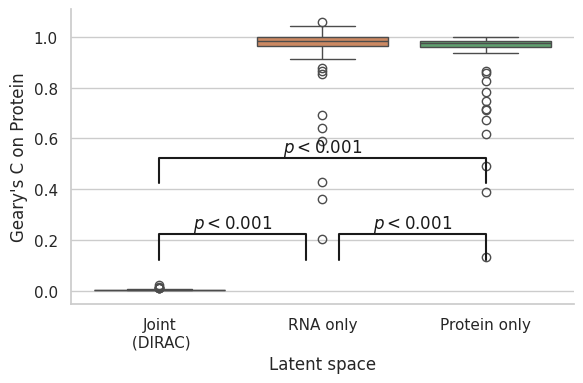

In [153]:
gearyc_latent = pd.DataFrame({"Joint\n (DIRAC)": total_dirac_joint_gearyc, 
                              "RNA only\n": total_dirac_rna_gearyc,
                              "Protein only\n": total_dirac_protein_gearyc})
gearyc_latent.to_csv(os.path.join(save_path, "Correlations", f"{data_name}_gearyc_latent.csv"))


# Calculate spearman correlations between latent space autocorrelations

from scipy.stats import spearmanr
from scipy.stats import pearsonr
from scipy.stats import ttest_ind
from scipy.stats import sem
from scipy.stats import ranksums

# Protein 
print("Total vs RNA")
print(ranksums(gearyc_latent.iloc[:, 0],
        gearyc_latent.iloc[:, 1]))


print("RNA vs Protein")

print(ranksums(gearyc_latent.iloc[:, 1],
        gearyc_latent.iloc[:, 2]))

print("Total vs Protein")

print(ranksums(gearyc_latent.iloc[:, 0],
        gearyc_latent.iloc[:, 2]))

# Plot for protein

fig, ax = plt.subplots(figsize = (6, 4))

ax = sns.boxplot(data = gearyc_latent, orient = "v")
ax.set(xlabel = "Latent space")
ax.set(ylabel = "Geary's C on Protein")

sns.despine()
plt.tight_layout()

# statistical annotation
x1, x2 = 0, 0.9
y, h, col = gearyc_latent.iloc[:, 0].max() + .1, .1, 'k'
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
ax.text((x1+x2)*.5, y+h, r"$p<0.001$", ha='center', va='bottom', color=col)

x1, x2 = 1.1, 2
y, h, col = gearyc_latent.iloc[:, 0].max() + .1, .1, 'k'
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
ax.text((x1+x2)*.5, y+h, r"$p<0.001$", ha='center', va='bottom', color=col)

x1, x2 = 0, 2
y, h, col = gearyc_latent.iloc[:, 0].max() + .4, .1, 'k'
ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, c=col)
ax.text((x1+x2)*.5, y+h, r"$p<0.001$", ha='center', va='bottom', color=col)

plt.tight_layout()
fig.savefig(os.path.join(save_path, "Correlations", f"{data_name}_jointmodel_autocorrelation.pdf"), dpi=300)